In [ ]:
from google.colab import files
uploaded= files.upload()

Saving Emotion_features (8).csv to Emotion_features (8).csv
Saving Emotion_features (7).csv to Emotion_features (7).csv
Saving kaggle.json to kaggle.json
Saving Emotion_features-final.csv to Emotion_features-final.csv
Saving valence.csv to valence.csv
Saving arousal.csv to arousal.csv


In [ ]:
!pip install -q kaggle

In [ ]:
!mkdir ~/.kaggle

In [ ]:
# upload kaggle.json file in colab directly
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list

ref                                                         title                                              size  lastUpdated          downloadCount  
----------------------------------------------------------  ------------------------------------------------  -----  -------------------  -------------  
gpreda/reddit-vaccine-myths                                 Reddit Vaccine Myths                              216KB  2021-03-18 08:52:01            546  
dhruvildave/wikibooks-dataset                               Wikibooks Dataset                                   1GB  2021-02-18 10:08:27            483  
crowww/a-large-scale-fish-dataset                           A Large Scale Fish Dataset                          3GB  2021-02-17 16:10:44            420  
imsparsh/musicnet-dataset                                   MusicNet Dataset                                   22GB  2021-02-18 14:12:19            190  
fatiimaezzahra/famous-iconic-women                          Famous Iconic Wo

In [ ]:
# Import OS for navigation and environment set up
import os

# Enable the Kaggle environment, use the path to the directory your Kaggle API JSON is stored in
os.environ['KAGGLE_CONFIG_DIR'] = '/content'

In [ ]:
!kaggle datasets download -d mansimht/msicvocaldataset

100% 6.49G/6.50G [01:36<00:00, 52.8MB/s]
100% 6.50G/6.50G [01:36<00:00, 72.3MB/s]


In [ ]:
!kaggle datasets download -d ddmasterdon/deam-songs

100% 10.8G/10.8G [03:09<00:00, 46.0MB/s]
100% 10.8G/10.8G [03:10<00:00, 61.3MB/s]


In [ ]:
!kaggle datasets download -d abhaybhadoriya/6001200

100% 5.94G/5.95G [01:26<00:00, 43.5MB/s]
100% 5.95G/5.95G [01:26<00:00, 73.6MB/s]


In [ ]:
import zipfile

zip_ref = zipfile.ZipFile("/content/msicvocaldataset.zip", 'r')
zip_ref.extractall("/content/msicvocaldataset")
zip_ref.close()

In [ ]:
import zipfile

zip_ref = zipfile.ZipFile("/content/deam-songs.zip", 'r')
zip_ref.extractall("/content/deam-songs")
zip_ref.close()

In [ ]:
import zipfile

zip_ref = zipfile.ZipFile("/content/6001200.zip", 'r')
zip_ref.extractall("/content/6001200")
zip_ref.close()

In [ ]:
!pip install spleeter

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
from IPython import display
import numpy as np
import librosa
import glob
import wave
import shutil
import sys
import csv
import gc
import time
from tqdm.notebook import tqdm
from PIL import Image
import pandas as pd


from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
from scipy.io import wavfile

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers.convolutional import Conv1D
from keras.layers.recurrent import LSTM
from keras.layers.convolutional import MaxPooling1D,AveragePooling1D
from keras.regularizers import l2
from tensorflow.keras import layers
from tensorflow.keras import models
from keras.utils import to_categorical

from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder
from keras.utils import np_utils
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import TensorBoard


In [ ]:
import random
random.seed(42)

# **Load .mp3 file and convert to .wav file**

In [ ]:
songs= os.listdir('/content/memd-audio/MEMD_audio')

In [ ]:
len(songs)

1802

In [ ]:
os.mkdir('./audio_files')

In [ ]:
os.mkdir('./songs')

In [ ]:
source_folder= '/content/memd-audio'
destination_folder= './audio_files'
#extension = input(.mp3)
for root,dirname,filenames in os.walk(source_folder):
  for filename in tqdm(filenames):
    if filename.endswith('{}'.format('.mp3')):
      shutil.copy(os.path.join(root,filename),destination_folder)

In [ ]:
for root,dirname,filenames in os.walk('./audio_files'):
  audio_mp3= glob.glob(root+"/*.mp3")
  for a_file in tqdm(audio_mp3[0:600]):
    !spleeter separate '{a_file}' -o songs/

INFO:spleeter:Downloading model archive https://github.com/deezer/spleeter/releases/download/v1.4.0/2stems.tar.gz
INFO:spleeter:Validating archive checksum
INFO:spleeter:Extracting downloaded 2stems archive
INFO:spleeter:2stems model file(s) extracted
INFO:spleeter:File songs/775/vocals.wav written succesfully
INFO:spleeter:File songs/775/accompaniment.wav written succesfully
INFO:spleeter:File songs/1096/vocals.wav written succesfully
INFO:spleeter:File songs/1096/accompaniment.wav written succesfully
INFO:spleeter:File songs/1118/vocals.wav written succesfully
INFO:spleeter:File songs/1118/accompaniment.wav written succesfully
INFO:spleeter:File songs/1747/accompaniment.wav written succesfully
INFO:spleeter:File songs/1747/vocals.wav written succesfully
INFO:spleeter:File songs/65/vocals.wav written succesfully
INFO:spleeter:File songs/65/accompaniment.wav written succesfully
INFO:spleeter:File songs/798/vocals.wav written succesfully
INFO:spleeter:File songs/798/accompaniment.wav wr

In [ ]:
!zip -r /content/songs.zip /content/songs

  adding: content/songs/ (stored 0%)
  adding: content/songs/214/ (stored 0%)
  adding: content/songs/214/vocals.wav (deflated 96%)
  adding: content/songs/214/accompaniment.wav (deflated 32%)
  adding: content/songs/767/ (stored 0%)
  adding: content/songs/767/vocals.wav (deflated 97%)
  adding: content/songs/767/accompaniment.wav (deflated 31%)
  adding: content/songs/98/ (stored 0%)
  adding: content/songs/98/vocals.wav (deflated 40%)
  adding: content/songs/98/accompaniment.wav (deflated 12%)
  adding: content/songs/1543/ (stored 0%)
  adding: content/songs/1543/vocals.wav (deflated 48%)
  adding: content/songs/1543/accompaniment.wav (deflated 6%)
  adding: content/songs/1883/ (stored 0%)
  adding: content/songs/1883/vocals.wav (deflated 74%)
  adding: content/songs/1883/accompaniment.wav (deflated 7%)
  adding: content/songs/2039/ (stored 0%)
  adding: content/songs/2039/vocals.wav (deflated 43%)
  adding: content/songs/2039/accompaniment.wav (deflated 12%)
  adding: content/songs

In [ ]:
from google.colab import files
files.download("/content/songs.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Processing on Music files**

In [ ]:
for root,dirnames,filenames in os.walk('/content/songs'):
  name= root.split('/')[-1]
  for files in tqdm(filenames):
    #vocal=files.split('.')[0]
    if files.startswith('accompaniment'):
      fname= root + '_' +files
      #print(fname)
      #print(os.path.join(root,files))
      shutil.copy(os.path.join(root,files),fname)

In [ ]:
import re
music=[]
for root,dirnames,filenames in os.walk('/content/songs'):
  for files in tqdm(filenames):
    if  re.search('^\s*[0-9]',files):
      music.append(root + '/' +files)

In [ ]:
len(music)

600

In [ ]:
music

['/content/songs/1652_accompaniment.wav',
 '/content/songs/1077_accompaniment.wav',
 '/content/songs/1591_accompaniment.wav',
 '/content/songs/21_accompaniment.wav',
 '/content/songs/1285_accompaniment.wav',
 '/content/songs/194_accompaniment.wav',
 '/content/songs/1471_accompaniment.wav',
 '/content/songs/1121_accompaniment.wav',
 '/content/songs/1850_accompaniment.wav',
 '/content/songs/453_accompaniment.wav',
 '/content/songs/307_accompaniment.wav',
 '/content/songs/56_accompaniment.wav',
 '/content/songs/1712_accompaniment.wav',
 '/content/songs/485_accompaniment.wav',
 '/content/songs/1740_accompaniment.wav',
 '/content/songs/481_accompaniment.wav',
 '/content/songs/1512_accompaniment.wav',
 '/content/songs/1311_accompaniment.wav',
 '/content/songs/798_accompaniment.wav',
 '/content/songs/1831_accompaniment.wav',
 '/content/songs/910_accompaniment.wav',
 '/content/songs/410_accompaniment.wav',
 '/content/songs/662_accompaniment.wav',
 '/content/songs/1588_accompaniment.wav',
 '/co

In [ ]:
for root,dirnames,filenames in os.walk('/content/6001200/songs600-1200/content/songs'):
  name= root.split('/')[-1]
  for files in tqdm(filenames):
    #vocal=files.split('.')[0]
    if files.startswith('accompaniment'):
      fname= root + '_' +files
      #print(fname)
      #print(os.path.join(root,files))
      shutil.copy(os.path.join(root,files),fname)

In [ ]:
import re
music1=[]
for root,dirnames,filenames in os.walk('/content/6001200/songs600-1200/content/songs'):
  for files in tqdm(filenames):
    if  re.search('^\s*[0-9]',files):
      music1.append(root + '/' +files)

In [ ]:
len(music1)

607

In [ ]:
music1

['/content/6001200/songs600-1200/content/songs/1401_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/910_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/1065_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/962_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/1002_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/1320_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/869_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/1277_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/1060_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/1350_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/925_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/1349_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/1266_accompaniment.wav',
 '/content/6001200/songs600-1200/content/songs/1400_accompaniment.wa

In [ ]:
def extract_feature(path):
    id = 1  # Song ID
    feature_set = pd.DataFrame()  # Feature Matrix
    
    # Individual Feature Vectors
    songname_vector = pd.Series()
    tempo_vector = pd.Series()
    total_beats = pd.Series()
    average_beats = pd.Series()
    chroma_stft_mean = pd.Series()
    chroma_stft_std = pd.Series()
    chroma_stft_var = pd.Series()
    chroma_cq_mean = pd.Series()
    chroma_cq_std = pd.Series()
    chroma_cq_var = pd.Series()
    chroma_cens_mean = pd.Series()
    chroma_cens_std = pd.Series()
    chroma_cens_var = pd.Series()
    mel_mean = pd.Series()
    mel_std = pd.Series()
    mel_var = pd.Series()
    mfcc_mean = pd.Series()
    mfcc_std = pd.Series()
    mfcc_var = pd.Series()
    mfcc_delta_mean = pd.Series()
    mfcc_delta_std = pd.Series()
    mfcc_delta_var = pd.Series()
    rmse_mean = pd.Series()
    rmse_std = pd.Series()
    rmse_var = pd.Series()
    cent_mean = pd.Series()
    cent_std = pd.Series()
    cent_var = pd.Series()
    spec_bw_mean = pd.Series()
    spec_bw_std = pd.Series()
    spec_bw_var = pd.Series()
    contrast_mean = pd.Series()
    contrast_std = pd.Series()
    contrast_var = pd.Series()
    rolloff_mean = pd.Series()
    rolloff_std = pd.Series()
    rolloff_var = pd.Series()
    poly_mean = pd.Series()
    poly_std = pd.Series()
    poly_var = pd.Series()
    tonnetz_mean = pd.Series()
    tonnetz_std = pd.Series()
    tonnetz_var = pd.Series()
    zcr_mean = pd.Series()
    zcr_std = pd.Series()
    zcr_var = pd.Series()
    harm_mean = pd.Series()
    harm_std = pd.Series()
    harm_var = pd.Series()
    perc_mean = pd.Series()
    perc_std = pd.Series()
    perc_var = pd.Series()
    frame_mean = pd.Series()
    frame_std = pd.Series()
    frame_var = pd.Series()
    
    
    # Traversing over each file in path
    file_data = path#[f for f in listdir(path) if isfile (join(path, f))]
    for line in tqdm(file_data):
        #if ( line[-1:] == '\n' ):
            #line = line[:-1]

        # Reading Song
        songname = line   
        name= songname.split('/')[6].split('_')[0]
        #print(name)
        # songname = audio.split('/')[5].split('.')[0]
        # s_id = re.findall(r'\d+', songname)    
        y, sr = librosa.load(songname, duration=60)
        S = np.abs(librosa.stft(y))
        
        # Extracting Features
        tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        chroma_cq = librosa.feature.chroma_cqt(y=y, sr=sr)
        chroma_cens = librosa.feature.chroma_cens(y=y, sr=sr)
        melspectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
        rmse = librosa.feature.rms(y=y)
        cent = librosa.feature.spectral_centroid(y=y, sr=sr)
        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        contrast = librosa.feature.spectral_contrast(S=S, sr=sr)
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        poly_features = librosa.feature.poly_features(S=S, sr=sr)
        tonnetz = librosa.feature.tonnetz(y=y, sr=sr)
        zcr = librosa.feature.zero_crossing_rate(y)
        harmonic = librosa.effects.harmonic(y)
        percussive = librosa.effects.percussive(y)
        
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        mfcc_delta = librosa.feature.delta(mfcc)
    
        onset_frames = librosa.onset.onset_detect(y=y, sr=sr)
        frames_to_time = librosa.frames_to_time(onset_frames[:20], sr=sr)
        
        # Transforming Features 
        songname_vector.at[id]=name # song name
        tempo_vector.at[id]= tempo  # tempo
        total_beats.at[id]= sum(beats)  # beats
        average_beats.at[id] = np.average(beats)
        chroma_stft_mean.at[id]= np.mean(chroma_stft)  # chroma stft
        chroma_stft_std.at[id]= np.std(chroma_stft)
        chroma_stft_var.at[id]= np.var(chroma_stft)
        chroma_cq_mean.at[id]=np.mean(chroma_cq)  # chroma cq
        chroma_cq_std.at[id]= np.std(chroma_cq)
        chroma_cq_var.at[id]= np.var(chroma_cq)
        chroma_cens_mean.at[id]= np.mean(chroma_cens)  # chroma cens
        chroma_cens_std.at[id]= np.std(chroma_cens)
        chroma_cens_var.at[id]= np.var(chroma_cens)
        mel_mean.at[id]= np.mean(melspectrogram)  # melspectrogram
        mel_std.at[id]= np.std(melspectrogram)
        mel_var.at[id]= np.var(melspectrogram)
        mfcc_mean.at[id]= np.mean(mfcc)  # mfcc
        mfcc_std.at[id]= np.std(mfcc)
        mfcc_var.at[id]= np.var(mfcc)
        mfcc_delta_mean.at[id]= np.mean(mfcc_delta)  # mfcc delta
        mfcc_delta_std.at[id]= np.std(mfcc_delta)
        mfcc_delta_var.at[id]= np.var(mfcc_delta)
        rmse_mean.at[id]= np.mean(rmse) # rmse
        rmse_std.at[id]= np.std(rmse)
        rmse_var.at[id]=np.var(rmse)
        cent_mean.at[id]= np.mean(cent)  # cent
        cent_std.at[id]= np.std(cent)
        cent_var.at[id]= np.var(cent)
        spec_bw_mean.at[id]=np.mean(spec_bw)  # spectral bandwidth
        spec_bw_std.at[id]= np.std(spec_bw)
        spec_bw_var.at[id]= np.var(spec_bw)
        contrast_mean.at[id]= np.mean(contrast)  # contrast
        contrast_std.at[id]= np.std(contrast)
        contrast_var.at[id]= np.var(contrast)
        rolloff_mean.at[id]= np.mean(rolloff) # rolloff
        rolloff_std.at[id]= np.std(rolloff)
        rolloff_var.at[id]= np.var(rolloff)
        poly_mean.at[id]= np.mean(poly_features)  # poly features
        poly_std.at[id]= np.std(poly_features)
        poly_var.at[id]= np.var(poly_features)
        tonnetz_mean.at[id]= np.mean(tonnetz) # tonnetz
        tonnetz_std.at[id]= np.std(tonnetz)
        tonnetz_var.at[id]= np.var(tonnetz)
        zcr_mean.at[id]= np.mean(zcr)  # zero crossing rate
        zcr_std.at[id]= np.std(zcr)
        zcr_var.at[id]= np.var(zcr)
        harm_mean.at[id]= np.mean(harmonic)  # harmonic
        harm_std.at[id]= np.std(harmonic)
        harm_var.at[id]= np.var(harmonic)
        perc_mean.at[id]= np.mean(percussive)  # percussive
        perc_std.at[id]= np.std(percussive)
        perc_var.at[id]= np.var(percussive)
        frame_mean.at[id]= np.mean(frames_to_time)  # frames
        frame_std.at[id]=np.std(frames_to_time)
        frame_var.at[id]= np.var(frames_to_time)
        
        print(songname)
        print(name)
        id = id+1
    
    # Concatenating Features into one csv and json format
    feature_set['song_id'] = songname_vector  # song name
    feature_set['tempo'] = tempo_vector  # tempo 
    feature_set['total_beats'] = total_beats  # beats
    feature_set['average_beats'] = average_beats
    feature_set['chroma_stft_mean'] = chroma_stft_mean  # chroma stft
    feature_set['chroma_stft_std'] = chroma_stft_std
    feature_set['chroma_stft_var'] = chroma_stft_var
    feature_set['chroma_cq_mean'] = chroma_cq_mean  # chroma cq
    feature_set['chroma_cq_std'] = chroma_cq_std
    feature_set['chroma_cq_var'] = chroma_cq_var
    feature_set['chroma_cens_mean'] = chroma_cens_mean  # chroma cens
    feature_set['chroma_cens_std'] = chroma_cens_std
    feature_set['chroma_cens_var'] = chroma_cens_var
    feature_set['melspectrogram_mean'] = mel_mean  # melspectrogram
    feature_set['melspectrogram_std'] = mel_std
    feature_set['melspectrogram_var'] = mel_var
    feature_set['mfcc_mean'] = mfcc_mean  # mfcc
    feature_set['mfcc_std'] = mfcc_std
    feature_set['mfcc_var'] = mfcc_var
    feature_set['mfcc_delta_mean'] = mfcc_delta_mean  # mfcc delta
    feature_set['mfcc_delta_std'] = mfcc_delta_std
    feature_set['mfcc_delta_var'] = mfcc_delta_var
    feature_set['rmse_mean'] = rmse_mean  # rmse
    feature_set['rmse_std'] = rmse_std
    feature_set['rmse_var'] = rmse_var
    feature_set['cent_mean'] = cent_mean  # cent
    feature_set['cent_std'] = cent_std
    feature_set['cent_var'] = cent_var
    feature_set['spec_bw_mean'] = spec_bw_mean  # spectral bandwidth
    feature_set['spec_bw_std'] = spec_bw_std
    feature_set['spec_bw_var'] = spec_bw_var
    feature_set['contrast_mean'] = contrast_mean  # contrast
    feature_set['contrast_std'] = contrast_std
    feature_set['contrast_var'] = contrast_var
    feature_set['rolloff_mean'] = rolloff_mean  # rolloff
    feature_set['rolloff_std'] = rolloff_std
    feature_set['rolloff_var'] = rolloff_var
    feature_set['poly_mean'] = poly_mean  # poly features
    feature_set['poly_std'] = poly_std
    feature_set['poly_var'] = poly_var
    feature_set['tonnetz_mean'] = tonnetz_mean  # tonnetz
    feature_set['tonnetz_std'] = tonnetz_std
    feature_set['tonnetz_var'] = tonnetz_var
    feature_set['zcr_mean'] = zcr_mean  # zero crossing rate
    feature_set['zcr_std'] = zcr_std
    feature_set['zcr_var'] = zcr_var
    feature_set['harm_mean'] = harm_mean  # harmonic
    feature_set['harm_std'] = harm_std
    feature_set['harm_var'] = harm_var
    feature_set['perc_mean'] = perc_mean  # percussive
    feature_set['perc_std'] = perc_std
    feature_set['perc_var'] = perc_var
    feature_set['frame_mean'] = frame_mean  # frames
    feature_set['frame_std'] = frame_std
    feature_set['frame_var'] = frame_var
    
    # Converting Dataframe into CSV Excel and JSON file
    feature_set.to_csv('Emotion_features.csv')
    feature_set.to_json('Emotion_features.json')
    

In [ ]:
extract_feature(music1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-pa

/content/6001200/songs600-1200/content/songs/1401_accompaniment.wav
1401
/content/6001200/songs600-1200/content/songs/910_accompaniment.wav
910
/content/6001200/songs600-1200/content/songs/1065_accompaniment.wav
1065
/content/6001200/songs600-1200/content/songs/962_accompaniment.wav
962
/content/6001200/songs600-1200/content/songs/1002_accompaniment.wav
1002
/content/6001200/songs600-1200/content/songs/1320_accompaniment.wav
1320
/content/6001200/songs600-1200/content/songs/869_accompaniment.wav
869
/content/6001200/songs600-1200/content/songs/1277_accompaniment.wav
1277
/content/6001200/songs600-1200/content/songs/1060_accompaniment.wav
1060
/content/6001200/songs600-1200/content/songs/1350_accompaniment.wav
1350
/content/6001200/songs600-1200/content/songs/925_accompaniment.wav
925
/content/6001200/songs600-1200/content/songs/1349_accompaniment.wav
1349
/content/6001200/songs600-1200/content/songs/1266_accompaniment.wav
1266
/content/6001200/songs600-1200/content/songs/1400_accompani

In [ ]:
extract_feature(music)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-pa

/content/songs/1652_accompaniment.wav
1652
/content/songs/1077_accompaniment.wav
1077
/content/songs/1591_accompaniment.wav
1591
/content/songs/21_accompaniment.wav
21
/content/songs/1285_accompaniment.wav
1285
/content/songs/194_accompaniment.wav
194
/content/songs/1471_accompaniment.wav
1471
/content/songs/1121_accompaniment.wav
1121
/content/songs/1850_accompaniment.wav
1850
/content/songs/453_accompaniment.wav
453
/content/songs/307_accompaniment.wav
307
/content/songs/56_accompaniment.wav
56
/content/songs/1712_accompaniment.wav
1712
/content/songs/485_accompaniment.wav
485
/content/songs/1740_accompaniment.wav
1740
/content/songs/481_accompaniment.wav
481
/content/songs/1512_accompaniment.wav
1512
/content/songs/1311_accompaniment.wav
1311
/content/songs/798_accompaniment.wav
798
/content/songs/1831_accompaniment.wav
1831
/content/songs/910_accompaniment.wav
910
/content/songs/410_accompaniment.wav
410
/content/songs/662_accompaniment.wav
662
/content/songs/1588_accompaniment.wav

In [ ]:
from google.colab import files
files.download("/content/Emotion_features.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Processing of Labels**

In [ ]:
arousal= pd.read_csv('/content/arousal.csv')
arousal.head(5)

,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,sample_19500ms,sample_20000ms,sample_20500ms,sample_21000ms,sample_21500ms,sample_22000ms,sample_22500ms,sample_23000ms,sample_23500ms,sample_24000ms,sample_24500ms,sample_25000ms,sample_25500ms,sample_26000ms,sample_26500ms,sample_27000ms,sample_27500ms,sample_28000ms,sample_28500ms,sample_29000ms,sample_29500ms,sample_30000ms,sample_30500ms,sample_31000ms,sample_31500ms,sample_32000ms,sample_32500ms,sample_33000ms,sample_33500ms,sample_34000ms,...,sample_607000ms,sample_607500ms,sample_608000ms,sample_608500ms,sample_609000ms,sample_609500ms,sample_610000ms,sample_610500ms,sample_611000ms,sample_611500ms,sample_612000ms,sample_612500ms,sample_613000ms,sample_613500ms,sample_614000ms,sample_614500ms,sample_615000ms,sample_615500ms,sample_616000ms,sample_616500ms,sample_617000ms,sample_617500ms,sample_618000ms,sample_618500ms,sample_619000ms,sample_619500ms,sample_620000ms,sample_620500ms,sample_621000ms,sample_621500ms,sample_622000ms,sample_622500ms,sample_623000ms,sample_623500ms,sample_624000ms,sample_624500ms,sample_625000ms,sample_625500ms,sample_626000ms,sample_626500ms
0,2,-0.109386,-0.114942,-0.116413,-0.118613,-0.126457,-0.133199,-0.136856,-0.144713,-0.138985,-0.137602,-0.138575,-0.140522,-0.144348,-0.150365,-0.152446,-0.153495,-0.155344,-0.153442,-0.147347,-0.146429,-0.143975,-0.141597,-0.140725,-0.140686,-0.139947,-0.147282,-0.157786,-0.164249,-0.168293,-0.164517,-0.157689,-0.153775,-0.207365,-0.253384,-0.256741,-0.254217,-0.252781,-0.258112,-0.263372,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3,-0.110846,-0.123973,-0.131103,-0.135956,-0.140775,-0.144664,-0.163118,-0.165218,-0.158858,-0.156783,-0.160081,-0.169374,-0.165857,-0.164108,-0.161764,-0.162446,-0.170079,-0.168090,-0.164870,-0.161530,-0.161725,-0.171526,-0.172795,-0.172407,-0.169303,-0.172701,-0.174472,-0.168315,-0.166760,-0.164218,-0.164253,-0.174865,-0.181806,-0.181193,-0.185401,-0.183284,-0.195656,-0.204603,-0.201497,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4,0.222327,0.179446,0.178388,0.184056,0.176042,0.178720,0.176345,0.175793,0.176154,0.176604,0.180138,0.176360,0.168876,0.171422,0.169539,0.168493,0.169783,0.173216,0.164226,0.165260,0.172209,0.177908,0.185147,0.215622,0.256678,0.263116,0.246703,0.243829,0.248545,0.249931,0.262921,0.260946,0.271850,0.265925,0.274905,0.270707,0.282363,0.281385,0.282713,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,-0.255613,-0.251579,-0.251958,-0.251124,-0.250763,-0.251957,-0.251957,-0.251957,-0.251957,-0.251957,-0.250848,-0.247444,-0.242066,-0.241087,-0.241087,-0.241087,-0.238962,-0.239783,-0.237609,-0.237609,-0.237609,-0.237609,-0.236711,-0.235870,-0.235870,-0.235870,-0.234921,-0.232773,-0.230218,-0.230182,-0.226740,-0.226740,-0.227618,-0.228476,-0.226738,-0.224566,-0.222392,-0.220232,-0.224296,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7,0.464234,0.460789,0.460991,0.461046,0.457240,0.465702,0.471809,0.469918,0.473377,0.470051,0.464498,0.471905,0.477970,0.449070,0.403073,0.394004,0.398359,0.393433,0.392229,0.386149,0.385554,0.384041,0.385499,0.381375,0.377777,0.370106,0.346995,0.349432,0.351037,0.342570,0.343068,0.346314,0.341944,0.339297,0.336535,0.331994,0.332121,0.333515,0.326968,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
valence= pd.read_csv('/content/valence.csv')
valence.head(5)

,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,sample_19500ms,sample_20000ms,sample_20500ms,sample_21000ms,sample_21500ms,sample_22000ms,sample_22500ms,sample_23000ms,sample_23500ms,sample_24000ms,sample_24500ms,sample_25000ms,sample_25500ms,sample_26000ms,sample_26500ms,sample_27000ms,sample_27500ms,sample_28000ms,sample_28500ms,sample_29000ms,sample_29500ms,sample_30000ms,sample_30500ms,sample_31000ms,sample_31500ms,sample_32000ms,sample_32500ms,sample_33000ms,sample_33500ms,sample_34000ms,...,sample_606500ms,sample_607000ms,sample_607500ms,sample_608000ms,sample_608500ms,sample_609000ms,sample_609500ms,sample_610000ms,sample_610500ms,sample_611000ms,sample_611500ms,sample_612000ms,sample_612500ms,sample_613000ms,sample_613500ms,sample_614000ms,sample_614500ms,sample_615000ms,sample_615500ms,sample_616000ms,sample_616500ms,sample_617000ms,sample_617500ms,sample_618000ms,sample_618500ms,sample_619000ms,sample_619500ms,sample_620000ms,sample_620500ms,sample_621000ms,sample_621500ms,sample_622000ms,sample_622500ms,sample_623000ms,sample_623500ms,sample_624000ms,sample_624500ms,sample_625000ms,sample_625500ms,sample_626000ms
0,2,-0.073341,-0.074661,-0.074077,-0.078154,-0.081588,-0.080873,-0.083611,-0.082145,-0.081632,-0.083874,-0.085105,-0.087188,-0.088078,-0.088742,-0.089806,-0.091019,-0.092365,-0.093924,-0.095489,-0.097135,-0.118034,-0.194191,-0.211173,-0.212976,-0.214670,-0.214924,-0.216802,-0.224368,-0.239330,-0.241585,-0.243941,-0.246843,-0.250692,-0.251579,-0.259747,-0.286162,-0.298050,-0.296910,-0.302182,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3,-0.189702,-0.187765,-0.183740,-0.188761,-0.193704,-0.190834,-0.189041,-0.197554,-0.202871,-0.209757,-0.212038,-0.206937,-0.206569,-0.215245,-0.225404,-0.232054,-0.231102,-0.228758,-0.235275,-0.242087,-0.242565,-0.238323,-0.235547,-0.260169,-0.283524,-0.287248,-0.285436,-0.290708,-0.299718,-0.298106,-0.297120,-0.299704,-0.304227,-0.301861,-0.297445,-0.294633,-0.304702,-0.310677,-0.309332,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4,0.154286,0.148063,0.146956,0.151180,0.135942,0.076832,0.084487,0.088513,0.090944,0.085544,0.100403,0.179465,0.183864,0.162215,0.136317,0.092502,0.081918,0.096085,0.089629,0.090773,0.099315,0.098499,0.100844,0.100649,0.098971,0.110439,0.116545,0.128038,0.133658,0.133888,0.134824,0.149676,0.170748,0.183955,0.194449,0.195255,0.194667,0.194214,0.195980,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,0.149053,0.148260,0.147369,0.146956,0.147857,0.146927,0.145651,0.145795,0.146420,0.152565,0.153315,0.147846,0.138537,0.137735,0.137826,0.156451,0.204919,0.208784,0.239129,0.203294,0.142848,0.129963,0.125613,0.122064,0.121132,0.120463,0.121304,0.121304,0.121635,0.122609,0.122939,0.126212,0.129973,0.131581,0.132089,0.132173,0.132173,0.132173,0.132173,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7,0.342816,0.345193,0.332023,0.328887,0.327603,0.329011,0.327883,0.334822,0.328447,0.344121,0.337617,0.339964,0.329331,0.334279,0.335485,0.342974,0.345424,0.341366,0.334168,0.347387,0.347424,0.351215,0.352030,0.344706,0.353899,0.347019,0.345312,0.329848,0.325029,0.335758,0.339655,0.319205,0.334188,0.335342,0.323406,0.314509,0.322830,0.334673,0.324579,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
arousal_new= arousal.mean(axis=1,skipna=True)
arousal_new

0       -0.161493
1       -0.140840
2        0.304661
3       -0.150367
4        0.484877
          ...    
1797    12.589677
1798     3.953007
1799     6.721765
1800     6.609023
1801     4.244705
Length: 1802, dtype: float64

In [ ]:
valence_new= valence.mean(axis=1,skipna=True)
valence_new

0       -0.179191
1       -0.212316
2        0.218239
3        0.219829
4        0.441759
          ...    
1797    12.852410
1798     3.902026
1799     6.872667
1800     5.755491
1801     3.626204
Length: 1802, dtype: float64

In [ ]:
import re
ar_lst1=[]
val_lst1=[]
for root,dirnames,filenames in os.walk('/content/msicvocaldataset/content/songs'):
  name= root.split('/')[-1]
  for files in filenames:
    if files.startswith('accompaniment'):
      audio= root+files
      name= audio.split('/')[5].split('.')[0]
      s_id = re.findall(r'\d+', name)
      for id in s_id:
        id= int(id)
        ar_final= arousal.loc[arousal['song_id']==id]
        ar_lst1.append(ar_final)
        val_final= valence.loc[valence['song_id']==id]
        val_lst1.append(val_final)


In [ ]:
import re
ar_lst2=[]
val_lst2=[]
for root,dirnames,filenames in os.walk('/content/deam-songs/content/songs'):
  name= root.split('/')[-1]
  for files in filenames:
    if files.startswith('accompaniment'):
      audio= root+files
      name= audio.split('/')[5].split('.')[0]
      s_id = re.findall(r'\d+', name)
      for id in s_id:
        id= int(id)
        ar_final= arousal.loc[arousal['song_id']==id]
        ar_lst2.append(ar_final)
        val_final= valence.loc[valence['song_id']==id]
        val_lst2.append(val_final)


In [ ]:
arousal_final1= pd.DataFrame()
arousal_final1= pd.concat(ar_lst1)
print(arousal_final1.shape)
arousal_final1

(600, 1225)


,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,sample_19500ms,sample_20000ms,sample_20500ms,sample_21000ms,sample_21500ms,sample_22000ms,sample_22500ms,sample_23000ms,sample_23500ms,sample_24000ms,sample_24500ms,sample_25000ms,sample_25500ms,sample_26000ms,sample_26500ms,sample_27000ms,sample_27500ms,sample_28000ms,sample_28500ms,sample_29000ms,sample_29500ms,sample_30000ms,sample_30500ms,sample_31000ms,sample_31500ms,sample_32000ms,sample_32500ms,sample_33000ms,sample_33500ms,sample_34000ms,...,sample_607000ms,sample_607500ms,sample_608000ms,sample_608500ms,sample_609000ms,sample_609500ms,sample_610000ms,sample_610500ms,sample_611000ms,sample_611500ms,sample_612000ms,sample_612500ms,sample_613000ms,sample_613500ms,sample_614000ms,sample_614500ms,sample_615000ms,sample_615500ms,sample_616000ms,sample_616500ms,sample_617000ms,sample_617500ms,sample_618000ms,sample_618500ms,sample_619000ms,sample_619500ms,sample_620000ms,sample_620500ms,sample_621000ms,sample_621500ms,sample_622000ms,sample_622500ms,sample_623000ms,sample_623500ms,sample_624000ms,sample_624500ms,sample_625000ms,sample_625500ms,sample_626000ms,sample_626500ms
1351,1608,0.544000,0.546000,0.553000,0.553000,0.558000,0.567000,0.563000,0.533000,0.507000,0.389000,0.522000,0.573000,0.579000,0.581000,0.586000,0.592000,0.593000,0.597000,0.591000,0.594000,0.591000,0.593000,0.594000,0.557000,0.566000,0.580000,0.580000,0.576000,0.578000,0.579000,0.582000,0.573000,0.571000,0.572000,0.584000,0.582000,0.587000,0.588000,0.595000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1552,1809,0.184444,0.181111,0.184444,0.186667,0.185556,0.182222,0.167778,0.155556,0.158889,0.156667,0.180000,0.196667,0.208889,0.214444,0.218889,0.224444,0.207778,0.177778,0.193333,0.222222,0.230000,0.226667,0.225556,0.220000,0.218889,0.203333,0.207778,0.211111,0.208889,0.216667,0.216667,0.216667,0.227778,0.240000,0.245556,0.250000,0.247778,0.241111,0.227778,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1273,1530,0.212000,0.205000,0.202000,0.203000,0.209000,0.201000,0.206000,0.202000,0.200000,0.203000,0.202000,0.211000,0.206000,0.204000,0.209000,0.205000,0.212000,0.168000,0.177000,0.152000,0.139000,0.167000,0.193000,0.185000,0.170000,0.168000,0.164000,0.167000,0.157000,0.162000,0.165000,0.168000,0.180000,0.184000,0.188000,0.185000,0.165000,0.158000,0.155000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,111,0.079876,0.082588,0.085167,0.090242,0.094145,0.097165,0.099660,0.103812,0.106047,0.108189,0.103886,0.104080,0.100279,0.101365,0.124951,0.118698,0.113805,0.109428,0.118238,0.133068,0.120274,0.119597,0.118407,0.130155,0.126620,0.123105,0.111398,0.108031,0.116248,0.126147,0.110001,0.095611,0.096502,0.114277,0.112570,0.097145,0.091082,0.089627,0.102325,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1570,1827,0.477000,0.462000,0.456000,0.448000,0.444000,0.435000,0.444000,0.447000,0.438000,0.433000,0.436000,0.422000,0.420000,0.426000,0.421000,0.424000,0.421000,0.415000,0.413000,0.421000,0.425000,0.423000,0.438000,0.484000,0.507000,0.512000,0.520000,0.529000,0.524000,0.524000,0.527000,0.532000,0.531000,0.527000,0.534000,0.541000,0.540000,0.533000,0.529000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [ ]:
arousal_final2= pd.DataFrame()
arousal_final2= pd.concat(ar_lst2)
print(arousal_final2.shape)
arousal_final2

(600, 1225)


,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,sample_19500ms,sample_20000ms,sample_20500ms,sample_21000ms,sample_21500ms,sample_22000ms,sample_22500ms,sample_23000ms,sample_23500ms,sample_24000ms,sample_24500ms,sample_25000ms,sample_25500ms,sample_26000ms,sample_26500ms,sample_27000ms,sample_27500ms,sample_28000ms,sample_28500ms,sample_29000ms,sample_29500ms,sample_30000ms,sample_30500ms,sample_31000ms,sample_31500ms,sample_32000ms,sample_32500ms,sample_33000ms,sample_33500ms,sample_34000ms,...,sample_607000ms,sample_607500ms,sample_608000ms,sample_608500ms,sample_609000ms,sample_609500ms,sample_610000ms,sample_610500ms,sample_611000ms,sample_611500ms,sample_612000ms,sample_612500ms,sample_613000ms,sample_613500ms,sample_614000ms,sample_614500ms,sample_615000ms,sample_615500ms,sample_616000ms,sample_616500ms,sample_617000ms,sample_617500ms,sample_618000ms,sample_618500ms,sample_619000ms,sample_619500ms,sample_620000ms,sample_620500ms,sample_621000ms,sample_621500ms,sample_622000ms,sample_622500ms,sample_623000ms,sample_623500ms,sample_624000ms,sample_624500ms,sample_625000ms,sample_625500ms,sample_626000ms,sample_626500ms
1552,1809,0.184444,0.181111,0.184444,0.186667,0.185556,0.182222,0.167778,0.155556,0.158889,0.156667,0.180000,0.196667,0.208889,0.214444,0.218889,0.224444,0.207778,0.177778,0.193333,0.222222,0.230000,0.226667,0.225556,0.220000,0.218889,0.203333,0.207778,0.211111,0.208889,0.216667,0.216667,0.216667,0.227778,0.240000,0.245556,0.250000,0.247778,0.241111,0.227778,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1273,1530,0.212000,0.205000,0.202000,0.203000,0.209000,0.201000,0.206000,0.202000,0.200000,0.203000,0.202000,0.211000,0.206000,0.204000,0.209000,0.205000,0.212000,0.168000,0.177000,0.152000,0.139000,0.167000,0.193000,0.185000,0.170000,0.168000,0.164000,0.167000,0.157000,0.162000,0.165000,0.168000,0.180000,0.184000,0.188000,0.185000,0.165000,0.158000,0.155000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,111,0.079876,0.082588,0.085167,0.090242,0.094145,0.097165,0.099660,0.103812,0.106047,0.108189,0.103886,0.104080,0.100279,0.101365,0.124951,0.118698,0.113805,0.109428,0.118238,0.133068,0.120274,0.119597,0.118407,0.130155,0.126620,0.123105,0.111398,0.108031,0.116248,0.126147,0.110001,0.095611,0.096502,0.114277,0.112570,0.097145,0.091082,0.089627,0.102325,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1570,1827,0.477000,0.462000,0.456000,0.448000,0.444000,0.435000,0.444000,0.447000,0.438000,0.433000,0.436000,0.422000,0.420000,0.426000,0.421000,0.424000,0.421000,0.415000,0.413000,0.421000,0.425000,0.423000,0.438000,0.484000,0.507000,0.512000,0.520000,0.529000,0.524000,0.524000,0.527000,0.532000,0.531000,0.527000,0.534000,0.541000,0.540000,0.533000,0.529000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1723,1980,0.352000,0.375000,0.416000,0.424000,0.428000,0.410000,0.396000,0.420000,0.429000,0.415000,0.411000,0.381000,0.417000,0.418000,0.425000,0.401000,0.402000,0.397000,0.434000,0.437000,0.419000,0.412000,0.422000,0.435000,0.431000,0.434000,0.411000,0.410000,0.422000,0.436000,0.459000,0.435000,0.437000,0.444000,0.454000,0.455000,0.458000,0.439000,0.439000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [ ]:
arousal_final= pd.concat([arousal_final1,arousal_final2])
arousal_final

,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,sample_19500ms,sample_20000ms,sample_20500ms,sample_21000ms,sample_21500ms,sample_22000ms,sample_22500ms,sample_23000ms,sample_23500ms,sample_24000ms,sample_24500ms,sample_25000ms,sample_25500ms,sample_26000ms,sample_26500ms,sample_27000ms,sample_27500ms,sample_28000ms,sample_28500ms,sample_29000ms,sample_29500ms,sample_30000ms,sample_30500ms,sample_31000ms,sample_31500ms,sample_32000ms,sample_32500ms,sample_33000ms,sample_33500ms,sample_34000ms,...,sample_607000ms,sample_607500ms,sample_608000ms,sample_608500ms,sample_609000ms,sample_609500ms,sample_610000ms,sample_610500ms,sample_611000ms,sample_611500ms,sample_612000ms,sample_612500ms,sample_613000ms,sample_613500ms,sample_614000ms,sample_614500ms,sample_615000ms,sample_615500ms,sample_616000ms,sample_616500ms,sample_617000ms,sample_617500ms,sample_618000ms,sample_618500ms,sample_619000ms,sample_619500ms,sample_620000ms,sample_620500ms,sample_621000ms,sample_621500ms,sample_622000ms,sample_622500ms,sample_623000ms,sample_623500ms,sample_624000ms,sample_624500ms,sample_625000ms,sample_625500ms,sample_626000ms,sample_626500ms
1351,1608,0.544000,0.546000,0.553000,0.553000,0.558000,0.567000,0.563000,0.533000,0.507000,0.389000,0.522000,0.573000,0.579000,0.581000,0.586000,0.592000,0.593000,0.597000,0.591000,0.594000,0.591000,0.593000,0.594000,0.557000,0.566000,0.580000,0.580000,0.576000,0.578000,0.579000,0.582000,0.573000,0.571000,0.572000,0.584000,0.582000,0.587000,0.588000,0.595000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1552,1809,0.184444,0.181111,0.184444,0.186667,0.185556,0.182222,0.167778,0.155556,0.158889,0.156667,0.180000,0.196667,0.208889,0.214444,0.218889,0.224444,0.207778,0.177778,0.193333,0.222222,0.230000,0.226667,0.225556,0.220000,0.218889,0.203333,0.207778,0.211111,0.208889,0.216667,0.216667,0.216667,0.227778,0.240000,0.245556,0.250000,0.247778,0.241111,0.227778,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1273,1530,0.212000,0.205000,0.202000,0.203000,0.209000,0.201000,0.206000,0.202000,0.200000,0.203000,0.202000,0.211000,0.206000,0.204000,0.209000,0.205000,0.212000,0.168000,0.177000,0.152000,0.139000,0.167000,0.193000,0.185000,0.170000,0.168000,0.164000,0.167000,0.157000,0.162000,0.165000,0.168000,0.180000,0.184000,0.188000,0.185000,0.165000,0.158000,0.155000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,111,0.079876,0.082588,0.085167,0.090242,0.094145,0.097165,0.099660,0.103812,0.106047,0.108189,0.103886,0.104080,0.100279,0.101365,0.124951,0.118698,0.113805,0.109428,0.118238,0.133068,0.120274,0.119597,0.118407,0.130155,0.126620,0.123105,0.111398,0.108031,0.116248,0.126147,0.110001,0.095611,0.096502,0.114277,0.112570,0.097145,0.091082,0.089627,0.102325,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1570,1827,0.477000,0.462000,0.456000,0.448000,0.444000,0.435000,0.444000,0.447000,0.438000,0.433000,0.436000,0.422000,0.420000,0.426000,0.421000,0.424000,0.421000,0.415000,0.413000,0.421000,0.425000,0.423000,0.438000,0.484000,0.507000,0.512000,0.520000,0.529000,0.524000,0.524000,0.527000,0.532000,0.531000,0.527000,0.534000,0.541000,0.540000,0.533000,0.529000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [ ]:
arousal_new= arousal_final.mean(axis=1,skipna=True)
arousal_new

1351    26.930230
1552    29.873151
1273    25.252115
85       1.920389
1570    30.434410
          ...    
31       0.769305
772     16.922082
1615    30.983721
1627    31.307672
139      2.383854
Length: 1200, dtype: float64

In [ ]:
valence_final1= pd.DataFrame()
valence_final1= pd.concat(val_lst1)
print(valence_final1.shape)
valence_final1

(600, 1224)


,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,sample_19500ms,sample_20000ms,sample_20500ms,sample_21000ms,sample_21500ms,sample_22000ms,sample_22500ms,sample_23000ms,sample_23500ms,sample_24000ms,sample_24500ms,sample_25000ms,sample_25500ms,sample_26000ms,sample_26500ms,sample_27000ms,sample_27500ms,sample_28000ms,sample_28500ms,sample_29000ms,sample_29500ms,sample_30000ms,sample_30500ms,sample_31000ms,sample_31500ms,sample_32000ms,sample_32500ms,sample_33000ms,sample_33500ms,sample_34000ms,...,sample_606500ms,sample_607000ms,sample_607500ms,sample_608000ms,sample_608500ms,sample_609000ms,sample_609500ms,sample_610000ms,sample_610500ms,sample_611000ms,sample_611500ms,sample_612000ms,sample_612500ms,sample_613000ms,sample_613500ms,sample_614000ms,sample_614500ms,sample_615000ms,sample_615500ms,sample_616000ms,sample_616500ms,sample_617000ms,sample_617500ms,sample_618000ms,sample_618500ms,sample_619000ms,sample_619500ms,sample_620000ms,sample_620500ms,sample_621000ms,sample_621500ms,sample_622000ms,sample_622500ms,sample_623000ms,sample_623500ms,sample_624000ms,sample_624500ms,sample_625000ms,sample_625500ms,sample_626000ms
1351,1608,-0.010000,-0.007000,-0.009000,-0.010000,-0.015000,-0.017000,0.010000,-0.003000,0.012000,0.043000,0.060000,0.074000,0.080000,0.081000,0.099000,0.097000,0.098000,0.094000,0.090000,0.087000,0.082000,0.079000,0.076000,0.074000,0.076000,0.075000,0.076000,0.038000,0.018000,0.015000,0.012000,0.011000,0.009000,0.014000,0.012000,0.017000,0.025000,0.026000,0.024000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1552,1809,0.045000,0.033000,0.014000,0.021000,0.031000,0.035000,0.002000,-0.029000,-0.028000,-0.029000,-0.014000,0.001000,0.006000,0.017000,0.028000,0.039000,0.039000,-0.002000,-0.005000,0.009000,0.016000,0.012000,0.012000,0.009000,0.012000,0.007000,-0.002000,0.006000,0.012000,0.010000,-0.027000,-0.048000,-0.043000,-0.032000,-0.020000,-0.033000,-0.042000,-0.045000,-0.071000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1273,1530,0.242000,0.235000,0.229000,0.244000,0.225000,0.250000,0.250000,0.278000,0.291000,0.292000,0.290000,0.279000,0.273000,0.270000,0.235000,0.315000,0.332000,0.324000,0.331000,0.326000,0.323000,0.339000,0.340000,0.344000,0.342000,0.342000,0.354000,0.350000,0.366000,0.352000,0.348000,0.350000,0.345000,0.350000,0.332000,0.339000,0.339000,0.337000,0.345000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,111,-0.011893,0.009642,0.005492,0.011827,0.012449,-0.005554,-0.011967,-0.014803,-0.018583,-0.017438,-0.005023,-0.007819,-0.012497,-0.009658,0.008930,0.019433,0.013535,0.010713,0.016675,0.003547,0.002557,-0.004856,-0.016498,-0.008052,0.012304,0.008822,0.004695,0.004964,0.010146,0.015764,0.003400,-0.007566,-0.001006,0.016057,0.021027,0.013124,0.008206,0.017265,0.025960,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1570,1827,0.188000,0.169000,0.165000,0.156000,0.128000,0.120000,0.120000,0.121000,0.124000,0.125000,0.108000,0.101000,0.109000,0.105000,0.101000,0.103000,0.103000,0.106000,0.099000,0.094000,0.103000,0.109000,0.114000,0.134000,0.161000,0.169000,0.163000,0.170000,0.166000,0.161000,0.155000,0.155000,0.154000,0.161000,0.158000,0.159000,0.162000,0.161000,0.168000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
valence_final2= pd.DataFrame()
valence_final2= pd.concat(val_lst2)
print(valence_final2.shape)
valence_final2

(600, 1224)


,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,sample_19500ms,sample_20000ms,sample_20500ms,sample_21000ms,sample_21500ms,sample_22000ms,sample_22500ms,sample_23000ms,sample_23500ms,sample_24000ms,sample_24500ms,sample_25000ms,sample_25500ms,sample_26000ms,sample_26500ms,sample_27000ms,sample_27500ms,sample_28000ms,sample_28500ms,sample_29000ms,sample_29500ms,sample_30000ms,sample_30500ms,sample_31000ms,sample_31500ms,sample_32000ms,sample_32500ms,sample_33000ms,sample_33500ms,sample_34000ms,...,sample_606500ms,sample_607000ms,sample_607500ms,sample_608000ms,sample_608500ms,sample_609000ms,sample_609500ms,sample_610000ms,sample_610500ms,sample_611000ms,sample_611500ms,sample_612000ms,sample_612500ms,sample_613000ms,sample_613500ms,sample_614000ms,sample_614500ms,sample_615000ms,sample_615500ms,sample_616000ms,sample_616500ms,sample_617000ms,sample_617500ms,sample_618000ms,sample_618500ms,sample_619000ms,sample_619500ms,sample_620000ms,sample_620500ms,sample_621000ms,sample_621500ms,sample_622000ms,sample_622500ms,sample_623000ms,sample_623500ms,sample_624000ms,sample_624500ms,sample_625000ms,sample_625500ms,sample_626000ms
1552,1809,0.045000,0.033000,0.014000,0.021000,0.031000,0.035000,0.002000,-0.029000,-0.028000,-0.029000,-0.014000,0.001000,0.006000,0.017000,0.028000,0.039000,0.039000,-0.002000,-0.005000,0.009000,0.016000,0.012000,0.012000,0.009000,0.012000,0.007000,-0.002000,0.006000,0.012000,0.010000,-0.027000,-0.048000,-0.043000,-0.032000,-0.020000,-0.033000,-0.042000,-0.045000,-0.071000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1273,1530,0.242000,0.235000,0.229000,0.244000,0.225000,0.250000,0.250000,0.278000,0.291000,0.292000,0.290000,0.279000,0.273000,0.270000,0.235000,0.315000,0.332000,0.324000,0.331000,0.326000,0.323000,0.339000,0.340000,0.344000,0.342000,0.342000,0.354000,0.350000,0.366000,0.352000,0.348000,0.350000,0.345000,0.350000,0.332000,0.339000,0.339000,0.337000,0.345000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,111,-0.011893,0.009642,0.005492,0.011827,0.012449,-0.005554,-0.011967,-0.014803,-0.018583,-0.017438,-0.005023,-0.007819,-0.012497,-0.009658,0.008930,0.019433,0.013535,0.010713,0.016675,0.003547,0.002557,-0.004856,-0.016498,-0.008052,0.012304,0.008822,0.004695,0.004964,0.010146,0.015764,0.003400,-0.007566,-0.001006,0.016057,0.021027,0.013124,0.008206,0.017265,0.025960,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1570,1827,0.188000,0.169000,0.165000,0.156000,0.128000,0.120000,0.120000,0.121000,0.124000,0.125000,0.108000,0.101000,0.109000,0.105000,0.101000,0.103000,0.103000,0.106000,0.099000,0.094000,0.103000,0.109000,0.114000,0.134000,0.161000,0.169000,0.163000,0.170000,0.166000,0.161000,0.155000,0.155000,0.154000,0.161000,0.158000,0.159000,0.162000,0.161000,0.168000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1723,1980,0.263000,0.259000,0.260000,0.250000,0.258000,0.244000,0.260000,0.258000,0.265000,0.258000,0.264000,0.259000,0.263000,0.261000,0.265000,0.269000,0.267000,0.265000,0.266000,0.269000,0.258000,0.264000,0.181000,0.142000,0.147000,0.144000,0.143000,0.141000,0.143000,0.149000,0.146000,0.145000,0.142000,0.146000,0.144000,0.144000,0.142000,0.146000,0.144000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [ ]:
valence_final= pd.concat([valence_final1,valence_final2])
valence_final

,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,sample_19500ms,sample_20000ms,sample_20500ms,sample_21000ms,sample_21500ms,sample_22000ms,sample_22500ms,sample_23000ms,sample_23500ms,sample_24000ms,sample_24500ms,sample_25000ms,sample_25500ms,sample_26000ms,sample_26500ms,sample_27000ms,sample_27500ms,sample_28000ms,sample_28500ms,sample_29000ms,sample_29500ms,sample_30000ms,sample_30500ms,sample_31000ms,sample_31500ms,sample_32000ms,sample_32500ms,sample_33000ms,sample_33500ms,sample_34000ms,...,sample_606500ms,sample_607000ms,sample_607500ms,sample_608000ms,sample_608500ms,sample_609000ms,sample_609500ms,sample_610000ms,sample_610500ms,sample_611000ms,sample_611500ms,sample_612000ms,sample_612500ms,sample_613000ms,sample_613500ms,sample_614000ms,sample_614500ms,sample_615000ms,sample_615500ms,sample_616000ms,sample_616500ms,sample_617000ms,sample_617500ms,sample_618000ms,sample_618500ms,sample_619000ms,sample_619500ms,sample_620000ms,sample_620500ms,sample_621000ms,sample_621500ms,sample_622000ms,sample_622500ms,sample_623000ms,sample_623500ms,sample_624000ms,sample_624500ms,sample_625000ms,sample_625500ms,sample_626000ms
1351,1608,-0.010000,-0.007000,-0.009000,-0.010000,-0.015000,-0.017000,0.010000,-0.003000,0.012000,0.043000,0.060000,0.074000,0.080000,0.081000,0.099000,0.097000,0.098000,0.094000,0.090000,0.087000,0.082000,0.079000,0.076000,0.074000,0.076000,0.075000,0.076000,0.038000,0.018000,0.015000,0.012000,0.011000,0.009000,0.014000,0.012000,0.017000,0.025000,0.026000,0.024000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1552,1809,0.045000,0.033000,0.014000,0.021000,0.031000,0.035000,0.002000,-0.029000,-0.028000,-0.029000,-0.014000,0.001000,0.006000,0.017000,0.028000,0.039000,0.039000,-0.002000,-0.005000,0.009000,0.016000,0.012000,0.012000,0.009000,0.012000,0.007000,-0.002000,0.006000,0.012000,0.010000,-0.027000,-0.048000,-0.043000,-0.032000,-0.020000,-0.033000,-0.042000,-0.045000,-0.071000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1273,1530,0.242000,0.235000,0.229000,0.244000,0.225000,0.250000,0.250000,0.278000,0.291000,0.292000,0.290000,0.279000,0.273000,0.270000,0.235000,0.315000,0.332000,0.324000,0.331000,0.326000,0.323000,0.339000,0.340000,0.344000,0.342000,0.342000,0.354000,0.350000,0.366000,0.352000,0.348000,0.350000,0.345000,0.350000,0.332000,0.339000,0.339000,0.337000,0.345000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,111,-0.011893,0.009642,0.005492,0.011827,0.012449,-0.005554,-0.011967,-0.014803,-0.018583,-0.017438,-0.005023,-0.007819,-0.012497,-0.009658,0.008930,0.019433,0.013535,0.010713,0.016675,0.003547,0.002557,-0.004856,-0.016498,-0.008052,0.012304,0.008822,0.004695,0.004964,0.010146,0.015764,0.003400,-0.007566,-0.001006,0.016057,0.021027,0.013124,0.008206,0.017265,0.025960,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1570,1827,0.188000,0.169000,0.165000,0.156000,0.128000,0.120000,0.120000,0.121000,0.124000,0.125000,0.108000,0.101000,0.109000,0.105000,0.101000,0.103000,0.103000,0.106000,0.099000,0.094000,0.103000,0.109000,0.114000,0.134000,0.161000,0.169000,0.163000,0.170000,0.166000,0.161000,0.155000,0.155000,0.154000,0.161000,0.158000,0.159000,0.162000,0.161000,0.168000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
valence_new= valence_final.mean(axis=1,skipna=True)
valence_new

1351    26.387197
1552    29.639148
1273    25.394049
85       1.829766
1570    30.091525
          ...    
31       0.967959
772     16.829541
1615    30.653361
1627    31.352328
139      2.617747
Length: 1200, dtype: float64

In [ ]:
new_df= pd.DataFrame(columns=['song_id','arousal','valence'])
new_df['song_id']= valence_final.iloc[:,0]
new_df['arousal']= arousal_new
new_df['valence']= valence_new
new_df

,song_id,arousal,valence
1351,1608,26.930230,26.387197
1552,1809,29.873151,29.639148
1273,1530,25.252115,25.394049
85,111,1.920389,1.829766
1570,1827,30.434410,30.091525
...,...,...,...
31,49,0.769305,0.967959
772,1029,16.922082,16.829541
1615,1872,30.983721,30.653361
1627,1884,31.307672,31.352328


In [ ]:
new_df['arousal'].min()

-0.15036725901639345

In [ ]:
new_df['valence'].max()

33.22870491803279

Extract feeling from arosual and valence:

"Happy", # Valence > 0 and Arousal >0

"Calm", # Valence > 0 and Arousal < 0

"Angry", # Valence <0 and Arousal > 0

"Sad", # Valence < 0 and Arousal < 0

In [ ]:
def feeling_map(s):
    feeling=[]
    if s['valence'] >= 0 and s['arousal'] >= 0:
        feeling.append('Happy') 
    elif s['valence'] < 0 and s['arousal'] >= 0:
        feeling.append('Angry')
    elif s['valence'] < 0 and s['arousal'] < 0:
        feeling.append('Sad') 
    elif s['valence'] >= 0 and s['arousal'] < 0:
        feeling.append('Calm')
    return feeling

In [ ]:
# Add a new column
new_df["Feeling"] = new_df.apply(feeling_map, axis=1)
new_df["Feeling"] = [f[0] for f in new_df['Feeling']]
# new_df["Feeling"]= new_df["Feeling"].astype('str')
print(new_df["Feeling"].unique())
new_df.dtypes

['Happy' 'Calm' 'Sad']


song_id      int64
arousal    float64
valence    float64
Feeling     object
dtype: object

In [ ]:
new_df= new_df.drop(['arousal','valence'],axis=1)
new_df


,song_id,Feeling
1351,1608,Happy
1552,1809,Happy
1273,1530,Happy
85,111,Happy
1570,1827,Happy
...,...,...
31,49,Happy
772,1029,Happy
1615,1872,Happy
1627,1884,Happy


In [ ]:
Emotion_features1= pd.read_csv('/content/Emotion_features-final.csv')
Emotion_features1= Emotion_features1.drop(['Unnamed: 0'],axis=1)
Emotion_features1

,song_id,tempo,total_beats,average_beats,chroma_stft_mean,chroma_stft_std,chroma_stft_var,chroma_cq_mean,chroma_cq_std,chroma_cq_var,chroma_cens_mean,chroma_cens_std,chroma_cens_var,melspectrogram_mean,melspectrogram_std,melspectrogram_var,mfcc_mean,mfcc_std,mfcc_var,mfcc_delta_mean,mfcc_delta_std,mfcc_delta_var,rmse_mean,rmse_std,rmse_var,cent_mean,cent_std,cent_var,spec_bw_mean,spec_bw_std,spec_bw_var,contrast_mean,contrast_std,contrast_var,rolloff_mean,rolloff_std,rolloff_var,poly_mean,poly_std,poly_var,tonnetz_mean,tonnetz_std,tonnetz_var,zcr_mean,zcr_std,zcr_var,harm_mean,harm_std,harm_var,perc_mean,perc_std,perc_var,frame_mean,frame_std,frame_var
0,1652,151.999081,110762,963.147826,0.437010,0.293050,0.085878,0.523548,0.256249,0.065664,0.256229,0.132966,0.017680,1.894846,14.866280,221.006271,0.017228,45.699951,2088.485596,0.000864,3.196954,10.220518,0.086213,0.032874,0.001081,2231.741928,595.077162,3.541168e+05,2439.025991,339.407546,115197.482542,20.348963,7.155096,51.195395,4876.370513,1263.410483,1.596206e+06,1.030636,1.236782,1.529631,0.012139,0.107958,0.011655,0.093243,0.042636,0.001818,6.602458e-07,0.061161,0.003741,-0.000290,0.050809,0.002582,1.974857,1.040256,1.082132
1,1077,103.359375,73503,967.144737,0.411183,0.318614,0.101515,0.492154,0.285945,0.081765,0.255168,0.134991,0.018223,2.378928,24.574562,603.909119,-5.862308,77.249771,5967.526855,-0.004128,7.129608,50.831310,0.082090,0.058745,0.003451,1866.234850,1194.269043,1.426279e+06,2223.126911,840.221600,705972.337385,20.457467,7.662238,58.709885,3987.242556,2776.953081,7.711468e+06,0.711130,1.114761,1.242692,0.025445,0.086497,0.007482,0.074009,0.078737,0.006200,-1.154972e-05,0.080210,0.006434,-0.000110,0.049470,0.002447,2.914104,1.525279,2.326476
2,1591,112.347147,81871,963.188235,0.368679,0.275385,0.075837,0.383588,0.258149,0.066641,0.236456,0.165596,0.027422,2.016396,10.707392,114.648239,0.136403,37.121468,1378.003418,0.001764,1.253283,1.570719,0.092440,0.017218,0.000296,2014.592785,266.006054,7.075922e+04,2332.431498,117.696444,13852.453039,19.152365,6.092009,37.112575,4666.882891,553.327375,3.061712e+05,1.229583,1.256927,1.579866,0.032038,0.143142,0.020490,0.069522,0.019254,0.000371,3.226373e-06,0.082274,0.006769,0.000049,0.022696,0.000515,1.695057,0.886869,0.786536
3,21,135.999178,96323,963.230000,0.280784,0.284023,0.080669,0.296082,0.273986,0.075069,0.201473,0.206741,0.042742,9.531027,44.875938,2013.849854,-1.580827,37.644997,1417.145630,0.011836,2.666884,7.112272,0.198082,0.048960,0.002397,1658.128588,436.416579,1.904594e+05,2055.423887,411.138698,169035.028634,24.376633,7.304104,53.349929,3595.024286,1207.167706,1.457254e+06,2.237114,2.442048,5.963597,-0.000997,0.205094,0.042064,0.071345,0.023265,0.000541,-3.038190e-06,0.185257,0.034320,-0.000012,0.046715,0.002182,1.633524,1.104457,1.219825
4,1285,135.999178,95568,955.680000,0.416998,0.283642,0.080453,0.406608,0.245316,0.060180,0.247641,0.148348,0.022007,2.449393,14.419033,207.908508,0.721859,49.021984,2403.154785,-0.000034,2.836127,8.043615,0.102255,0.017430,0.000304,1641.425259,568.392500,3.230700e+05,1976.082604,548.941676,301336.964046,20.987331,7.244249,52.479150,3570.245078,1505.539197,2.266648e+06,1.186360,1.263474,1.596366,0.038425,0.100911,0.010183,0.062804,0.026109,0.000682,6.695238e-06,0.087116,0.007589,0.000061,0.032243,0.001040,2.326639,1.451323,2.106339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,1716,117.453835,86028,966.606742,0.354424,0.292652,0.085645,0.535158,0.244137,0.059603,0.255829,0.133735,0.017885,2.705899,17.541142,307.691650,1.756337,54.601147,2981.285156,0.002732,5.005929,25.059324,0.103556,0.035989,0.001295,1807.893855,841.352323,7.078737e+05,2337.778401,824.212002,679325.424138,21.415194,6.819427,46.504584,4319.107216,2410.198484,5.809057e+06,1.082292,1.351353,1.826155,0.022753,0.063010,0.0039

In [ ]:
Emotion_features2= pd.read_csv('/content/Emotion_features (7).csv')
Emotion_features2= Emotion_features2.drop(['Unnamed: 0'],axis=1)
Emotion_features2

,song_id,tempo,total_beats,average_beats,chroma_stft_mean,chroma_stft_std,chroma_stft_var,chroma_cq_mean,chroma_cq_std,chroma_cq_var,chroma_cens_mean,chroma_cens_std,chroma_cens_var,melspectrogram_mean,melspectrogram_std,melspectrogram_var,mfcc_mean,mfcc_std,mfcc_var,mfcc_delta_mean,mfcc_delta_std,mfcc_delta_var,rmse_mean,rmse_std,rmse_var,cent_mean,cent_std,cent_var,spec_bw_mean,spec_bw_std,spec_bw_var,contrast_mean,contrast_std,contrast_var,rolloff_mean,rolloff_std,rolloff_var,poly_mean,poly_std,poly_var,tonnetz_mean,tonnetz_std,tonnetz_var,zcr_mean,zcr_std,zcr_var,harm_mean,harm_std,harm_var,perc_mean,perc_std,perc_var,frame_mean,frame_std,frame_var
0,1401,135.999178,92754,946.469388,0.312788,0.291131,0.084757,0.622186,0.196353,0.038555,0.280192,0.069468,0.004826,1.839022,11.223348,125.963539,0.911872,48.710487,2372.711670,-0.002452,2.848104,8.111697,0.085009,0.029032,0.000843,1724.298344,263.212379,6.928076e+04,2051.885315,335.084571,112281.670045,20.864379,7.111495,50.573365,3752.138422,774.203268,5.993907e+05,1.058427,1.241130,1.540405,0.010088,0.050020,0.002502,0.077159,0.022168,0.000491,4.050246e-05,0.062754,0.003938,0.000046,0.047034,0.002212,2.362630,1.288883,1.661219
1,910,143.554688,100384,947.018868,0.498276,0.281369,0.079169,0.622091,0.218167,0.047597,0.278143,0.077263,0.005970,9.803773,67.837845,4601.973145,2.537692,36.835327,1356.841309,0.008689,4.175576,17.435436,0.191401,0.083007,0.006890,2701.992752,1096.609518,1.202552e+06,2689.153102,555.634915,308730.158497,19.219031,7.562477,57.191062,5856.509838,2006.315800,4.025303e+06,2.239878,2.892516,8.366649,-0.000187,0.046589,0.002171,0.121563,0.100973,0.010196,8.336003e-07,0.150088,0.022526,-0.000087,0.106721,0.011389,1.786776,1.015152,1.030534
2,1560,99.384014,68888,970.253521,0.483953,0.290186,0.084208,0.605198,0.250338,0.062669,0.273203,0.093238,0.008693,1.591865,12.539309,157.234253,-3.017865,52.709789,2778.322021,-0.002797,3.869113,14.970036,0.074574,0.038436,0.001477,2207.468729,900.903209,8.116266e+05,2444.527324,551.162459,303780.055741,18.302845,7.380197,54.467304,4788.771043,1990.661084,3.962732e+06,0.916566,1.252798,1.569504,0.001240,0.067333,0.004534,0.105426,0.081649,0.006666,-2.362235e-05,0.051297,0.002631,-0.000065,0.051726,0.002676,2.169905,1.073442,1.152278
3,962,92.285156,46174,796.103448,0.481310,0.263013,0.069176,0.519993,0.224371,0.050342,0.269122,0.104435,0.010907,1.420742,5.537407,30.662882,-1.695030,33.316551,1109.992554,0.011934,1.517640,2.303233,0.086584,0.016250,0.000264,2427.947254,332.321621,1.104377e+05,2143.231298,281.886809,79460.172971,19.530936,7.339084,53.862159,4563.186386,769.584875,5.922609e+05,1.483634,1.555560,2.419766,-0.012362,0.070526,0.004974,0.150225,0.032761,0.001073,1.254835e-06,0.066380,0.004406,0.000010,0.032213,0.001038,23.426612,6.032779,36.394420
4,1002,51.679688,34027,1000.794118,0.362140,0.323298,0.104522,0.303247,0.278533,0.077581,0.207625,0.200562,0.040225,1.059234,14.911892,222.364532,-6.297896,101.164337,10234.223633,0.000202,2.491018,6.205168,0.049926,0.044810,0.002008,641.241803,567.422110,3.219679e+05,1226.034683,688.758629,474388.449352,23.784654,7.120989,50.708486,1099.798905,1444.475276,2.086509e+06,0.318136,0.594712,0.353683,0.035816,0.160975,0.025913,0.022228,0.026474,0.000701,-8.407793e-07,0.055029,0.003028,0.000010,0.025006,0.000625,9.264762,6.455419,41.672432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,1559,161.499023,113951,973.940171,0.362767,0.301763,0.091061,0.468321,0.249758,0.062379,0.257936,0.129624,0.016802,2.755178,28.048883,786.739868,-0.183832,48.206696,2323.885498,-0.006161,2.039391,4.159117,0.096813,0.050535,0.002554,2188.101395,803.162571,6.450701e+05,2496.667750,620.397132,384892.601542,20.607510,7.236111,52.361305,5015.203007,2027.811691,4.112020e+06,0.968715,1.204304,1.450348,0.012935,0.087320,0.00

In [ ]:
Emotion_features3= pd.read_csv('/content/Emotion_features (8).csv')
Emotion_features3= Emotion_features3.drop(['Unnamed: 0'],axis=1)
Emotion_features3

,song_id,tempo,total_beats,average_beats,chroma_stft_mean,chroma_stft_std,chroma_stft_var,chroma_cq_mean,chroma_cq_std,chroma_cq_var,chroma_cens_mean,chroma_cens_std,chroma_cens_var,melspectrogram_mean,melspectrogram_std,melspectrogram_var,mfcc_mean,mfcc_std,mfcc_var,mfcc_delta_mean,mfcc_delta_std,mfcc_delta_var,rmse_mean,rmse_std,rmse_var,cent_mean,cent_std,cent_var,spec_bw_mean,spec_bw_std,spec_bw_var,contrast_mean,contrast_std,contrast_var,rolloff_mean,rolloff_std,rolloff_var,poly_mean,poly_std,poly_var,tonnetz_mean,tonnetz_std,tonnetz_var,zcr_mean,zcr_std,zcr_var,harm_mean,harm_std,harm_var,perc_mean,perc_std,perc_var,frame_mean,frame_std,frame_var
0,1401,135.999178,92754,946.469388,0.312788,0.291131,0.084757,0.622186,0.196353,0.038555,0.280192,0.069468,0.004826,1.839022,11.223348,125.963539,0.911872,48.710487,2372.711670,-0.002452,2.848104,8.111697,0.085009,0.029032,0.000843,1724.298344,263.212379,6.928076e+04,2051.885315,335.084571,112281.670045,20.864379,7.111495,50.573365,3752.138422,774.203268,5.993907e+05,1.058427,1.241130,1.540405,0.010088,0.050020,0.002502,0.077159,0.022168,0.000491,4.050246e-05,0.062754,0.003938,0.000046,0.047034,0.002212,2.362630,1.288883,1.661219
1,910,143.554688,100384,947.018868,0.498276,0.281369,0.079169,0.622091,0.218167,0.047597,0.278143,0.077263,0.005970,9.803773,67.837845,4601.973145,2.537692,36.835327,1356.841309,0.008689,4.175576,17.435434,0.191401,0.083007,0.006890,2701.992752,1096.609518,1.202552e+06,2689.153102,555.634915,308730.158497,19.219031,7.562477,57.191062,5856.509838,2006.315800,4.025303e+06,2.239878,2.892516,8.366649,-0.000187,0.046589,0.002171,0.121563,0.100973,0.010196,8.336003e-07,0.150088,0.022526,-0.000087,0.106721,0.011389,1.786776,1.015152,1.030534
2,1065,143.554688,102164,982.346154,0.468144,0.285012,0.081232,0.614178,0.213523,0.045592,0.277246,0.080422,0.006468,5.733431,31.789705,1010.585388,5.190294,41.968811,1761.380981,0.000127,1.974547,3.898837,0.155569,0.029894,0.000894,1488.644988,442.583689,1.958803e+05,1897.845189,380.139392,144505.956981,19.058350,6.966279,48.529048,3316.457724,984.038010,9.683308e+05,1.863867,1.909334,3.645555,0.007943,0.049940,0.002494,0.055838,0.026602,0.000708,3.789433e-05,0.110018,0.012104,0.001506,0.067909,0.004612,2.212862,1.180298,1.393103
3,962,92.285156,46174,796.103448,0.481310,0.263013,0.069176,0.519993,0.224371,0.050342,0.269122,0.104435,0.010907,1.420742,5.537407,30.662882,-1.695030,33.316551,1109.992554,0.011934,1.517640,2.303233,0.086584,0.016250,0.000264,2427.947254,332.321621,1.104377e+05,2143.231298,281.886809,79460.172971,19.530936,7.339084,53.862159,4563.186386,769.584875,5.922609e+05,1.483634,1.555560,2.419766,-0.012362,0.070526,0.004974,0.150225,0.032761,0.001073,1.254835e-06,0.066380,0.004406,0.000010,0.032213,0.001038,23.426612,6.032779,36.394420
4,1002,51.679688,34027,1000.794118,0.362140,0.323298,0.104522,0.303247,0.278533,0.077581,0.207625,0.200562,0.040225,1.059234,14.911892,222.364532,-6.297896,101.164337,10234.223633,0.000202,2.491018,6.205168,0.049926,0.044810,0.002008,641.241803,567.422110,3.219679e+05,1226.034683,688.758629,474388.449352,23.784654,7.120989,50.708486,1099.798905,1444.475276,2.086509e+06,0.318136,0.594712,0.353683,0.035816,0.160975,0.025913,0.022228,0.026474,0.000701,-8.407793e-07,0.055029,0.003028,0.000010,0.025006,0.000625,9.264762,6.455419,41.672432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602,488,95.703125,58210,881.969697,0.247949,0.294240,0.086577,0.355692,0.268796,0.072251,0.214995,0.192641,0.037111,0.229249,2.334743,5.451027,-13.111128,98.707748,9743.219727,0.004536,1.014957,1.030138,0.023932,0.019935,0.000397,940.280039,359.519823,1.292545e+05,1542.945098,386.451277,149344.589869,21.284421,5.825905,33.941164,1469.166850,920.953137,8.481547e+05,0.214416,0.329498,0.108569,-0.091125,0.137935,0.019026,0.040

In [ ]:
Emotion_features= pd.concat([Emotion_features1,Emotion_features2])
Emotion_features

,song_id,tempo,total_beats,average_beats,chroma_stft_mean,chroma_stft_std,chroma_stft_var,chroma_cq_mean,chroma_cq_std,chroma_cq_var,chroma_cens_mean,chroma_cens_std,chroma_cens_var,melspectrogram_mean,melspectrogram_std,melspectrogram_var,mfcc_mean,mfcc_std,mfcc_var,mfcc_delta_mean,mfcc_delta_std,mfcc_delta_var,rmse_mean,rmse_std,rmse_var,cent_mean,cent_std,cent_var,spec_bw_mean,spec_bw_std,spec_bw_var,contrast_mean,contrast_std,contrast_var,rolloff_mean,rolloff_std,rolloff_var,poly_mean,poly_std,poly_var,tonnetz_mean,tonnetz_std,tonnetz_var,zcr_mean,zcr_std,zcr_var,harm_mean,harm_std,harm_var,perc_mean,perc_std,perc_var,frame_mean,frame_std,frame_var
0,1652,151.999081,110762,963.147826,0.437010,0.293050,0.085878,0.523548,0.256249,0.065664,0.256229,0.132966,0.017680,1.894846,14.866280,221.006271,0.017228,45.699951,2088.485596,0.000864,3.196954,10.220518,0.086213,0.032874,0.001081,2231.741928,595.077162,3.541168e+05,2439.025991,339.407546,115197.482542,20.348963,7.155096,51.195395,4876.370513,1263.410483,1.596206e+06,1.030636,1.236782,1.529631,0.012139,0.107958,0.011655,0.093243,0.042636,0.001818,6.602458e-07,0.061161,0.003741,-0.000290,0.050809,0.002582,1.974857,1.040256,1.082132
1,1077,103.359375,73503,967.144737,0.411183,0.318614,0.101515,0.492154,0.285945,0.081765,0.255168,0.134991,0.018223,2.378928,24.574562,603.909119,-5.862308,77.249771,5967.526855,-0.004128,7.129608,50.831310,0.082090,0.058745,0.003451,1866.234850,1194.269043,1.426279e+06,2223.126911,840.221600,705972.337385,20.457467,7.662238,58.709885,3987.242556,2776.953081,7.711468e+06,0.711130,1.114761,1.242692,0.025445,0.086497,0.007482,0.074009,0.078737,0.006200,-1.154972e-05,0.080210,0.006434,-0.000110,0.049470,0.002447,2.914104,1.525279,2.326476
2,1591,112.347147,81871,963.188235,0.368679,0.275385,0.075837,0.383588,0.258149,0.066641,0.236456,0.165596,0.027422,2.016396,10.707392,114.648239,0.136403,37.121468,1378.003418,0.001764,1.253283,1.570719,0.092440,0.017218,0.000296,2014.592785,266.006054,7.075922e+04,2332.431498,117.696444,13852.453039,19.152365,6.092009,37.112575,4666.882891,553.327375,3.061712e+05,1.229583,1.256927,1.579866,0.032038,0.143142,0.020490,0.069522,0.019254,0.000371,3.226373e-06,0.082274,0.006769,0.000049,0.022696,0.000515,1.695057,0.886869,0.786536
3,21,135.999178,96323,963.230000,0.280784,0.284023,0.080669,0.296082,0.273986,0.075069,0.201473,0.206741,0.042742,9.531027,44.875938,2013.849854,-1.580827,37.644997,1417.145630,0.011836,2.666884,7.112272,0.198082,0.048960,0.002397,1658.128588,436.416579,1.904594e+05,2055.423887,411.138698,169035.028634,24.376633,7.304104,53.349929,3595.024286,1207.167706,1.457254e+06,2.237114,2.442048,5.963597,-0.000997,0.205094,0.042064,0.071345,0.023265,0.000541,-3.038190e-06,0.185257,0.034320,-0.000012,0.046715,0.002182,1.633524,1.104457,1.219825
4,1285,135.999178,95568,955.680000,0.416998,0.283642,0.080453,0.406608,0.245316,0.060180,0.247641,0.148348,0.022007,2.449393,14.419033,207.908508,0.721859,49.021984,2403.154785,-0.000034,2.836127,8.043615,0.102255,0.017430,0.000304,1641.425259,568.392500,3.230700e+05,1976.082604,548.941676,301336.964046,20.987331,7.244249,52.479150,3570.245078,1505.539197,2.266648e+06,1.186360,1.263474,1.596366,0.038425,0.100911,0.010183,0.062804,0.026109,0.000682,6.695238e-06,0.087116,0.007589,0.000061,0.032243,0.001040,2.326639,1.451323,2.106339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,1559,161.499023,113951,973.940171,0.362767,0.301763,0.091061,0.468321,0.249758,0.062379,0.257936,0.129624,0.016802,2.755178,28.048883,786.739868,-0.183832,48.206696,2323.885498,-0.006161,2.039391,4.159117,0.096813,0.050535,0.002554,2188.101395,803.162571,6.450701e+05,2496.667750,620.397132,384892.601542,20.607510,7.236111,52.361305,5015.203007,2027.811691,4.112020e+06,0.968715,1.204304,1.450348,0.012935,0.087320,0.00

In [ ]:
# Emotion_features=Emotion_features.drop_duplicates(['song_id'], keep=False)
# Emotion_features

In [ ]:
combined_df= pd.merge(Emotion_features,new_df,on='song_id')
print(combined_df.shape)
combined_df=combined_df.drop_duplicates(['song_id'], keep=False)
print(combined_df.shape)
combined_df.head(10)

(1582, 56)
(818, 56)


,song_id,tempo,total_beats,average_beats,chroma_stft_mean,chroma_stft_std,chroma_stft_var,chroma_cq_mean,chroma_cq_std,chroma_cq_var,chroma_cens_mean,chroma_cens_std,chroma_cens_var,melspectrogram_mean,melspectrogram_std,melspectrogram_var,mfcc_mean,mfcc_std,mfcc_var,mfcc_delta_mean,mfcc_delta_std,mfcc_delta_var,rmse_mean,rmse_std,rmse_var,cent_mean,cent_std,cent_var,spec_bw_mean,spec_bw_std,spec_bw_var,contrast_mean,contrast_std,contrast_var,rolloff_mean,rolloff_std,rolloff_var,poly_mean,poly_std,poly_var,tonnetz_mean,tonnetz_std,tonnetz_var,zcr_mean,zcr_std,zcr_var,harm_mean,harm_std,harm_var,perc_mean,perc_std,perc_var,frame_mean,frame_std,frame_var,Feeling
4,1077,103.359375,73503,967.144737,0.411183,0.318614,0.101515,0.492154,0.285945,0.081765,0.255168,0.134991,0.018223,2.378928,24.574562,603.909119,-5.862308,77.249771,5967.526855,-0.004128,7.129608,50.831310,0.082090,0.058745,0.003451,1866.234850,1194.269043,1.426279e+06,2223.126911,840.221600,705972.337385,20.457467,7.662238,58.709885,3987.242556,2776.953081,7.711468e+06,0.711130,1.114761,1.242692,0.025445,0.086497,0.007482,0.074009,0.078737,0.006200,-1.154972e-05,0.080210,0.006434,-0.000110,0.049470,0.002447,2.914104,1.525279,2.326476,Happy
5,1591,112.347147,81871,963.188235,0.368679,0.275385,0.075837,0.383588,0.258149,0.066641,0.236456,0.165596,0.027422,2.016396,10.707392,114.648239,0.136403,37.121468,1378.003418,0.001764,1.253283,1.570719,0.092440,0.017218,0.000296,2014.592785,266.006054,7.075922e+04,2332.431498,117.696444,13852.453039,19.152365,6.092009,37.112575,4666.882891,553.327375,3.061712e+05,1.229583,1.256927,1.579866,0.032038,0.143142,0.020490,0.069522,0.019254,0.000371,3.226373e-06,0.082274,0.006769,0.000049,0.022696,0.000515,1.695057,0.886869,0.786536,Happy
6,21,135.999178,96323,963.230000,0.280784,0.284023,0.080669,0.296082,0.273986,0.075069,0.201473,0.206741,0.042742,9.531027,44.875938,2013.849854,-1.580827,37.644997,1417.145630,0.011836,2.666884,7.112272,0.198082,0.048960,0.002397,1658.128588,436.416579,1.904594e+05,2055.423887,411.138698,169035.028634,24.376633,7.304104,53.349929,3595.024286,1207.167706,1.457254e+06,2.237114,2.442048,5.963597,-0.000997,0.205094,0.042064,0.071345,0.023265,0.000541,-3.038190e-06,0.185257,0.034320,-0.000012,0.046715,0.002182,1.633524,1.104457,1.219825,Happy
11,194,172.265625,118969,936.763780,0.229450,0.290741,0.084530,0.290524,0.300120,0.090072,0.185398,0.221271,0.048961,1.065080,8.149871,66.420395,-15.062553,89.762344,8057.278320,0.007964,1.830671,3.351357,0.060509,0.029174,0.000851,688.008129,134.477459,1.808419e+04,650.408879,102.101779,10424.773211,25.334124,6.036913,36.444318,1087.792856,259.732470,6.746096e+04,0.520791,0.631804,0.399176,0.065107,0.222376,0.049451,0.049420,0.010266,0.000105,-3.432030e-06,0.063490,0.004031,-0.000034,0.010510,0.000110,2.628499,1.651306,2.726812,Happy
12,1471,161.499023,111481,944.754237,0.424169,0.268975,0.072348,0.489946,0.231509,0.053597,0.267159,0.109358,0.011959,1.610813,6.285398,39.506237,0.012122,39.911289,1592.910889,0.001332,2.218964,4.923801,0.084256,0.015420,0.000238,2006.533893,535.945901,2.872380e+05,2206.967972,426.127938,181585.019919,19.117549,7.022250,49.312002,4280.679671,1403.981015,1.971163e+06,1.326572,1.428826,2.041545,0.052952,0.069334,0.004807,0.093986,0.034253,0.001173,-8.059002e-07,0.058744,0.003451,-0.000042,0.039863,0.001589,1.970213,1.133155,1.284039,Happy
21,453,117.453835,79931,951.559524,0.429275,0.308533,0.095193,0.432324,0.297005,0.088212,0.230155,0.174247,0.030362,14.105195,143.643784,20633.537109,3.234035,46.956501,2204.913086,0.009708,4.651251,21.634132,0.232497,0.116276,0.013520,2249.337288,1377.989267,1.898854e+06,2543.253192,902.616349,814716.273728,19.510766,7.473094,55.847135,5038.414527,3065.462748,9.397062e+06,2.243907,2.956088,8.738458,0.031028,0.161085,0.025948,0.072615,0.066121,0.004372,4.524868e-02,0.165724,0.027464,0.010944,0.140552,0.019755,2.645914,1.537478,2.363838,Happy
26,56,92.285156,66106,958.057971,0.312524,0.286442,0.082049,0.326

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


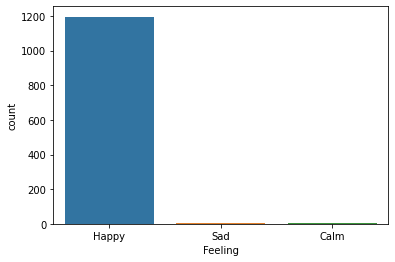

In [ ]:
# # visualize the target variable

# g = sns.countplot(combined_df['Feeling'])
# g.set_xticklabels(['Happy','Sad','Calm'])
# plt.show()

In [ ]:
# # class count
# class_count0,class_count1,class_count2= combined_df['Feeling'].value_counts()

# # Separate class
# class_0 = combined_df[combined_df['Feeling'] == 0]
# class_1 = combined_df[combined_df['Feeling'] == 1]
# class_2= combined_df[combined_df['Feeling'] == 2]
# print('class 0:', class_0.shape)
# print('class 1:', class_1.shape)
# print('class 2:', class_2.shape)

# class_1_over = class_1.sample(class_count0,replace=True)
# class_2_under = class_2.sample(class_count0,replace=True)

# df_test_over = pd.concat([class_0,class_1_over, class_1,class_2], axis=0)

# print("total class of 1 and0:",test_under['Class'].value_counts())# plot the count after under-sampeling
# test_under['Class'].value_counts().plot(kind='bar', title='count (target)')

# **Create Feature and Target Variable**

In [ ]:
X = combined_df.iloc[:,1:55]
Y = combined_df.Feeling

In [ ]:
# #For data imbalance
# from imblearn.under_sampling import RandomUnderSampler

# rus = RandomUnderSampler(return_indices=True)
# X_rus, y_rus, id_rus = rus.fit_sample(X, Y)

# print('Removed indexes:', id_rus)
# print(X_rus)
# print(y_rus)

Removed indexes: [ 733 1028 1039   58  450  296]
[[ 3042912.921403    -370186.72568136]
 [-1250065.20797422   -90494.57471431]
 [-1088394.9345778     95839.38903969]
 [ 2611283.56307937  -279300.95537457]
 [ -466627.46996686  -133335.92229487]
 [ -407165.88068134  -110792.90661863]]
['Calm' 'Calm' 'Happy' 'Happy' 'Sad' 'Sad']


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
X= combined_df.iloc[:,1:55]
y= combined_df.Feeling

In [ ]:
le= LabelEncoder()
combined_df['Feeling']= le.fit_transform(combined_df['Feeling'])

In [ ]:
X = combined_df.iloc[:,1:55]
Y = to_categorical(combined_df.Feeling, 3)

In [ ]:
X_train,X_test,y_train,y_test= train_test_split(X,Y,test_size=0.2,random_state=5,shuffle=True)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(960, 54)
(960, 3)
(240, 54)
(240, 3)


In [ ]:
# NORMALIZE DATA
mean = np.mean(X_train, axis=0)
std = np.std(X_train, axis=0)
X_train = (X_train - mean)/std
X_test = (X_test - mean)/std

print(X_train.shape)
print(X_test.shape)

(654, 54)
(164, 54)


In [ ]:
# TURN INTO ARRAYS
X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

In [ ]:
# # ONE HOT ENCODE EMOTION LABELS
# lb = LabelEncoder()
# y_train = to_categorical(lb.fit_transform(y_train))
# y_test = to_categorical(lb.fit_transform(y_test))

In [ ]:
# RESHAPE TO ADD 3D TENSOR FOR 1D CNN INPUT
X_train = X_train[:,:,np.newaxis]
X_test = X_test[:,:,np.newaxis]
print(X_train.shape)
print(X_test.shape)

(654, 54, 1)
(164, 54, 1)


# **Model Creation**

In [ ]:
import random
random.seed(42)

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
def model(input_shape, num_classes):
    inputs = tf.keras.layers.Input(shape=input_shape, name="input")

    x = Conv1D(64, 9, activation='relu',padding='same')(inputs)
    x = Conv1D(64, 9, activation='relu',padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling1D(pool_size=2)(x)
    x= Dropout(0.4)(x)
    x = Conv1D(128,9, activation='relu',padding='same')(x)
    x = Conv1D(128,9, activation='relu',padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling1D(pool_size=2)(x)
    x= Dropout(0.4)(x)
    x = Conv1D(256,9, activation='relu',padding='same')(x)
    x = Conv1D(256,9, activation='relu',padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = MaxPooling1D(pool_size=2)(x)
    x= Dropout(0.4)(x)
    x= Flatten()(x)
    #x = Dense(128, activation="relu")(x)

    outputs = Dense(num_classes, activation="softmax", name="output")(x)

    return models.Model(inputs=inputs, outputs=outputs)

model = model((X_train.shape[1],1), 3)

model.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           [(None, 54, 1)]           0         
_________________________________________________________________
conv1d_6 (Conv1D)            (None, 54, 64)            640       
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 54, 64)            36928     
_________________________________________________________________
batch_normalization (BatchNo (None, 54, 64)            256       
_________________________________________________________________
max_pooling1d_3 (MaxPooling1 (None, 27, 64)            0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 27, 64)            0         
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 27, 128)          

In [ ]:
# FIT MODEL
opt = Adam(lr=0.001)
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])
model_history=model.fit(X_train,y_train,batch_size=64, epochs=5, validation_data=(X_test,y_test))

Epoch 1/5
11/11 [==============================] - 3s 306ms/step - loss: 0.0845 - accuracy: 0.9954 - val_loss: 0.0566 - val_accuracy: 0.9939
Epoch 2/5
11/11 [==============================] - 3s 272ms/step - loss: 0.0273 - accuracy: 0.9908 - val_loss: 0.0460 - val_accuracy: 0.9939
Epoch 3/5
11/11 [==============================] - 3s 274ms/step - loss: 0.0545 - accuracy: 0.9954 - val_loss: 0.0400 - val_accuracy: 0.9939
Epoch 4/5
11/11 [==============================] - 3s 279ms/step - loss: 0.0309 - accuracy: 0.9954 - val_loss: 0.0499 - val_accuracy: 0.9939
Epoch 5/5
11/11 [==============================] - 3s 270ms/step - loss: 0.0190 - accuracy: 0.9939 - val_loss: 0.0551 - val_accuracy: 0.9939


In [ ]:
model.save("songs.h5")

# **Prediction of Song**

In [ ]:
def extract(path):
    id = 1  # Song ID
    feature_set = pd.DataFrame()  # Feature Matrix
    
    # Individual Feature Vectors
    #songname_vector = pd.Series()
    tempo_vector = pd.Series()
    total_beats = pd.Series()
    average_beats = pd.Series()
    chroma_stft_mean = pd.Series()
    chroma_stft_std = pd.Series()
    chroma_stft_var = pd.Series()
    chroma_cq_mean = pd.Series()
    chroma_cq_std = pd.Series()
    chroma_cq_var = pd.Series()
    chroma_cens_mean = pd.Series()
    chroma_cens_std = pd.Series()
    chroma_cens_var = pd.Series()
    mel_mean = pd.Series()
    mel_std = pd.Series()
    mel_var = pd.Series()
    mfcc_mean = pd.Series()
    mfcc_std = pd.Series()
    mfcc_var = pd.Series()
    mfcc_delta_mean = pd.Series()
    mfcc_delta_std = pd.Series()
    mfcc_delta_var = pd.Series()
    rmse_mean = pd.Series()
    rmse_std = pd.Series()
    rmse_var = pd.Series()
    cent_mean = pd.Series()
    cent_std = pd.Series()
    cent_var = pd.Series()
    spec_bw_mean = pd.Series()
    spec_bw_std = pd.Series()
    spec_bw_var = pd.Series()
    contrast_mean = pd.Series()
    contrast_std = pd.Series()
    contrast_var = pd.Series()
    rolloff_mean = pd.Series()
    rolloff_std = pd.Series()
    rolloff_var = pd.Series()
    poly_mean = pd.Series()
    poly_std = pd.Series()
    poly_var = pd.Series()
    tonnetz_mean = pd.Series()
    tonnetz_std = pd.Series()
    tonnetz_var = pd.Series()
    zcr_mean = pd.Series()
    zcr_std = pd.Series()
    zcr_var = pd.Series()
    harm_mean = pd.Series()
    harm_std = pd.Series()
    harm_var = pd.Series()
    perc_mean = pd.Series()
    perc_std = pd.Series()
    perc_var = pd.Series()
    frame_mean = pd.Series()
    frame_std = pd.Series()
    frame_var = pd.Series()
    
    
   

    # Reading Song
    songname = path   
    #name= songname.split('/')[4].split('_')[0]
    #print(name)
    # songname = audio.split('/')[5].split('.')[0]
    # s_id = re.findall(r'\d+', songname)    
    y, sr = librosa.load(songname, duration=60)
    S = np.abs(librosa.stft(y))
    
    # Extracting Features
    tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
    chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
    chroma_cq = librosa.feature.chroma_cqt(y=y, sr=sr)
    chroma_cens = librosa.feature.chroma_cens(y=y, sr=sr)
    melspectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
    rmse = librosa.feature.rms(y=y)
    cent = librosa.feature.spectral_centroid(y=y, sr=sr)
    spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
    contrast = librosa.feature.spectral_contrast(S=S, sr=sr)
    rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
    poly_features = librosa.feature.poly_features(S=S, sr=sr)
    tonnetz = librosa.feature.tonnetz(y=y, sr=sr)
    zcr = librosa.feature.zero_crossing_rate(y)
    harmonic = librosa.effects.harmonic(y)
    percussive = librosa.effects.percussive(y)
    
    mfcc = librosa.feature.mfcc(y=y, sr=sr)
    mfcc_delta = librosa.feature.delta(mfcc)

    onset_frames = librosa.onset.onset_detect(y=y, sr=sr)
    frames_to_time = librosa.frames_to_time(onset_frames[:20], sr=sr)
    
    # Transforming Features 
    #songname_vector.at[id]=name # song name
    tempo_vector.at[id]= tempo  # tempo
    total_beats.at[id]= sum(beats)  # beats
    average_beats.at[id] = np.average(beats)
    chroma_stft_mean.at[id]= np.mean(chroma_stft)  # chroma stft
    chroma_stft_std.at[id]= np.std(chroma_stft)
    chroma_stft_var.at[id]= np.var(chroma_stft)
    chroma_cq_mean.at[id]=np.mean(chroma_cq)  # chroma cq
    chroma_cq_std.at[id]= np.std(chroma_cq)
    chroma_cq_var.at[id]= np.var(chroma_cq)
    chroma_cens_mean.at[id]= np.mean(chroma_cens)  # chroma cens
    chroma_cens_std.at[id]= np.std(chroma_cens)
    chroma_cens_var.at[id]= np.var(chroma_cens)
    mel_mean.at[id]= np.mean(melspectrogram)  # melspectrogram
    mel_std.at[id]= np.std(melspectrogram)
    mel_var.at[id]= np.var(melspectrogram)
    mfcc_mean.at[id]= np.mean(mfcc)  # mfcc
    mfcc_std.at[id]= np.std(mfcc)
    mfcc_var.at[id]= np.var(mfcc)
    mfcc_delta_mean.at[id]= np.mean(mfcc_delta)  # mfcc delta
    mfcc_delta_std.at[id]= np.std(mfcc_delta)
    mfcc_delta_var.at[id]= np.var(mfcc_delta)
    rmse_mean.at[id]= np.mean(rmse) # rmse
    rmse_std.at[id]= np.std(rmse)
    rmse_var.at[id]=np.var(rmse)
    cent_mean.at[id]= np.mean(cent)  # cent
    cent_std.at[id]= np.std(cent)
    cent_var.at[id]= np.var(cent)
    spec_bw_mean.at[id]=np.mean(spec_bw)  # spectral bandwidth
    spec_bw_std.at[id]= np.std(spec_bw)
    spec_bw_var.at[id]= np.var(spec_bw)
    contrast_mean.at[id]= np.mean(contrast)  # contrast
    contrast_std.at[id]= np.std(contrast)
    contrast_var.at[id]= np.var(contrast)
    rolloff_mean.at[id]= np.mean(rolloff) # rolloff
    rolloff_std.at[id]= np.std(rolloff)
    rolloff_var.at[id]= np.var(rolloff)
    poly_mean.at[id]= np.mean(poly_features)  # poly features
    poly_std.at[id]= np.std(poly_features)
    poly_var.at[id]= np.var(poly_features)
    tonnetz_mean.at[id]= np.mean(tonnetz) # tonnetz
    tonnetz_std.at[id]= np.std(tonnetz)
    tonnetz_var.at[id]= np.var(tonnetz)
    zcr_mean.at[id]= np.mean(zcr)  # zero crossing rate
    zcr_std.at[id]= np.std(zcr)
    zcr_var.at[id]= np.var(zcr)
    harm_mean.at[id]= np.mean(harmonic)  # harmonic
    harm_std.at[id]= np.std(harmonic)
    harm_var.at[id]= np.var(harmonic)
    perc_mean.at[id]= np.mean(percussive)  # percussive
    perc_std.at[id]= np.std(percussive)
    perc_var.at[id]= np.var(percussive)
    frame_mean.at[id]= np.mean(frames_to_time)  # frames
    frame_std.at[id]=np.std(frames_to_time)
    frame_var.at[id]= np.var(frames_to_time)
    
    print(songname)
    #print(name)
    
    
    # Concatenating Features into one csv and json format
    #feature_set['song_id'] = songname_vector  # song name
    feature_set['tempo'] = tempo_vector  # tempo 
    feature_set['total_beats'] = total_beats  # beats
    feature_set['average_beats'] = average_beats
    feature_set['chroma_stft_mean'] = chroma_stft_mean  # chroma stft
    feature_set['chroma_stft_std'] = chroma_stft_std
    feature_set['chroma_stft_var'] = chroma_stft_var
    feature_set['chroma_cq_mean'] = chroma_cq_mean  # chroma cq
    feature_set['chroma_cq_std'] = chroma_cq_std
    feature_set['chroma_cq_var'] = chroma_cq_var
    feature_set['chroma_cens_mean'] = chroma_cens_mean  # chroma cens
    feature_set['chroma_cens_std'] = chroma_cens_std
    feature_set['chroma_cens_var'] = chroma_cens_var
    feature_set['melspectrogram_mean'] = mel_mean  # melspectrogram
    feature_set['melspectrogram_std'] = mel_std
    feature_set['melspectrogram_var'] = mel_var
    feature_set['mfcc_mean'] = mfcc_mean  # mfcc
    feature_set['mfcc_std'] = mfcc_std
    feature_set['mfcc_var'] = mfcc_var
    feature_set['mfcc_delta_mean'] = mfcc_delta_mean  # mfcc delta
    feature_set['mfcc_delta_std'] = mfcc_delta_std
    feature_set['mfcc_delta_var'] = mfcc_delta_var
    feature_set['rmse_mean'] = rmse_mean  # rmse
    feature_set['rmse_std'] = rmse_std
    feature_set['rmse_var'] = rmse_var
    feature_set['cent_mean'] = cent_mean  # cent
    feature_set['cent_std'] = cent_std
    feature_set['cent_var'] = cent_var
    feature_set['spec_bw_mean'] = spec_bw_mean  # spectral bandwidth
    feature_set['spec_bw_std'] = spec_bw_std
    feature_set['spec_bw_var'] = spec_bw_var
    feature_set['contrast_mean'] = contrast_mean  # contrast
    feature_set['contrast_std'] = contrast_std
    feature_set['contrast_var'] = contrast_var
    feature_set['rolloff_mean'] = rolloff_mean  # rolloff
    feature_set['rolloff_std'] = rolloff_std
    feature_set['rolloff_var'] = rolloff_var
    feature_set['poly_mean'] = poly_mean  # poly features
    feature_set['poly_std'] = poly_std
    feature_set['poly_var'] = poly_var
    feature_set['tonnetz_mean'] = tonnetz_mean  # tonnetz
    feature_set['tonnetz_std'] = tonnetz_std
    feature_set['tonnetz_var'] = tonnetz_var
    feature_set['zcr_mean'] = zcr_mean  # zero crossing rate
    feature_set['zcr_std'] = zcr_std
    feature_set['zcr_var'] = zcr_var
    feature_set['harm_mean'] = harm_mean  # harmonic
    feature_set['harm_std'] = harm_std
    feature_set['harm_var'] = harm_var
    feature_set['perc_mean'] = perc_mean  # percussive
    feature_set['perc_std'] = perc_std
    feature_set['perc_var'] = perc_var
    feature_set['frame_mean'] = frame_mean  # frames
    feature_set['frame_std'] = frame_std
    feature_set['frame_var'] = frame_var
    
    return feature_set
    # # Converting Dataframe into CSV Excel and JSON file
    # feature_set.to_csv('Emotion_features.csv')
    # feature_set.to_json('Emotion_features.json')
    

In [ ]:
!spleeter separate '/content/Passenger let her go.mp3' -o output/

INFO:spleeter:File output/Passenger let her go/vocals.wav written succesfully
INFO:spleeter:File output/Passenger let her go/accompaniment.wav written succesfully


In [ ]:
path='/content/output/Passenger let her go/accompaniment.wav'

In [ ]:
song= extract(path)
song 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  # Remove the CWD from sys.path w

/content/output/Passenger let her go/accompaniment.wav


,tempo,total_beats,average_beats,chroma_stft_mean,chroma_stft_std,chroma_stft_var,chroma_cq_mean,chroma_cq_std,chroma_cq_var,chroma_cens_mean,chroma_cens_std,chroma_cens_var,melspectrogram_mean,melspectrogram_std,melspectrogram_var,mfcc_mean,mfcc_std,mfcc_var,mfcc_delta_mean,mfcc_delta_std,mfcc_delta_var,rmse_mean,rmse_std,rmse_var,cent_mean,cent_std,cent_var,spec_bw_mean,spec_bw_std,spec_bw_var,contrast_mean,contrast_std,contrast_var,rolloff_mean,rolloff_std,rolloff_var,poly_mean,poly_std,poly_var,tonnetz_mean,tonnetz_std,tonnetz_var,zcr_mean,zcr_std,zcr_var,harm_mean,harm_std,harm_var,perc_mean,perc_std,perc_var,frame_mean,frame_std,frame_var
1,66.25601,18833,607.516129,0.325827,0.30415,0.092507,0.404787,0.311133,0.096804,0.219026,0.188045,0.035361,2.893521,51.352036,2637.031738,-10.237703,68.535728,4697.145996,0.009383,3.225279,10.402427,0.083173,0.074799,0.005595,1486.541723,1093.794355,1.196386e+06,1532.04968,967.753909,936547.627975,24.914674,7.544379,56.917647,2849.274437,2478.6429,6.143671e+06,0.748035,1.153795,1.331243,0.019579,0.18937,0.035861,0.078717,0.05467,0.002989,-0.000003,0.059943,0.003593,-0.000002,0.078665,0.006188,7.426902,4.585993,21.031328


In [ ]:
song

,tempo,total_beats,average_beats,chroma_stft_mean,chroma_stft_std,chroma_stft_var,chroma_cq_mean,chroma_cq_std,chroma_cq_var,chroma_cens_mean,chroma_cens_std,chroma_cens_var,melspectrogram_mean,melspectrogram_std,melspectrogram_var,mfcc_mean,mfcc_std,mfcc_var,mfcc_delta_mean,mfcc_delta_std,mfcc_delta_var,rmse_mean,rmse_std,rmse_var,cent_mean,cent_std,cent_var,spec_bw_mean,spec_bw_std,spec_bw_var,contrast_mean,contrast_std,contrast_var,rolloff_mean,rolloff_std,rolloff_var,poly_mean,poly_std,poly_var,tonnetz_mean,tonnetz_std,tonnetz_var,zcr_mean,zcr_std,zcr_var,harm_mean,harm_std,harm_var,perc_mean,perc_std,perc_var,frame_mean,frame_std,frame_var
1,66.25601,18833,607.516129,0.325827,0.30415,0.092507,0.404787,0.311133,0.096804,0.219026,0.188045,0.035361,2.893521,51.352036,2637.031738,-10.237703,68.535728,4697.145996,0.009383,3.225279,10.402427,0.083173,0.074799,0.005595,1486.541723,1093.794355,1.196386e+06,1532.04968,967.753909,936547.627975,24.914674,7.544379,56.917647,2849.274437,2478.6429,6.143671e+06,0.748035,1.153795,1.331243,0.019579,0.18937,0.035861,0.078717,0.05467,0.002989,-0.000003,0.059943,0.003593,-0.000002,0.078665,0.006188,7.426902,4.585993,21.031328


In [ ]:
le.classes_

array(['Calm', 'Happy', 'Sad'], dtype=object)

In [ ]:
def prediction_result(song):
  ans=model.predict(song)
  final= np.argmax(ans, axis=1)
  labels = {0:'Calm',1:'Happy', 2:'Sad'}
  print(f"Predicted Result : {labels[final[0]]}")

In [ ]:
prediction_result(song1)

Predicted Result : Happy
